In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree
from math import pi

from scipy import stats

import simspace as ss

# Fig. 1A: SimSpace Workflow & Applications

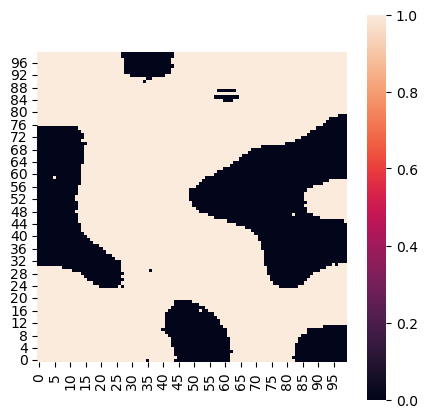

In [2]:
shape = (100, 100)
param_1 = ss.util.load_params('../data/fitted_params.json')

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
if n_state * (n_state - 1) != 2 * diag_length:
    raise ValueError("Invalid theta matrix size.")

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

sim1 = ss.SimSpace(
    shape=shape,
    num_states=n_state,
    num_iterations=4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=0,
    )
sim1.initialize()
sim1.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
sim1.gibbs_sampler()    # Gibbs sampling
# sim1.density_sampler(density_replicates)  # Cell density of each niche
# sim1.perturbation(step = 0.2)
sim1.plot_niche(figsize=(5, 5), dpi=100)

# Fig. 1B: Process of simulations in scatterplots

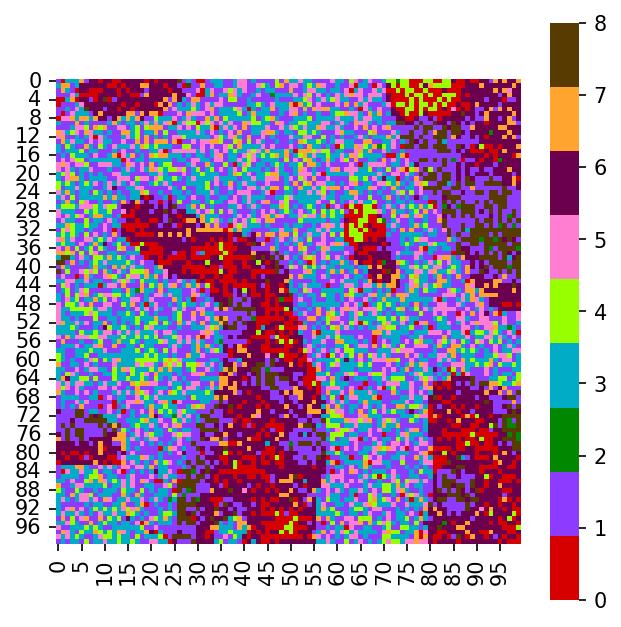

In [6]:
shape = (100, 100)
param_1 = ss.util.load_params('../data/fitted_params.json')

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
if n_state * (n_state - 1) != 2 * diag_length:
    raise ValueError("Invalid theta matrix size.")

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

sim1 = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
sim1.initialize()
sim1.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
sim1.gibbs_sampler()    # Gibbs sampling
# sim1.density_sampler(density_replicates)  # Cell density of each niche
# sim1.perturbation(step = 0.2)
sim1.plot_grid(figsize=(5, 5), dpi=150)

# Fig. 2B: Random de-novo example

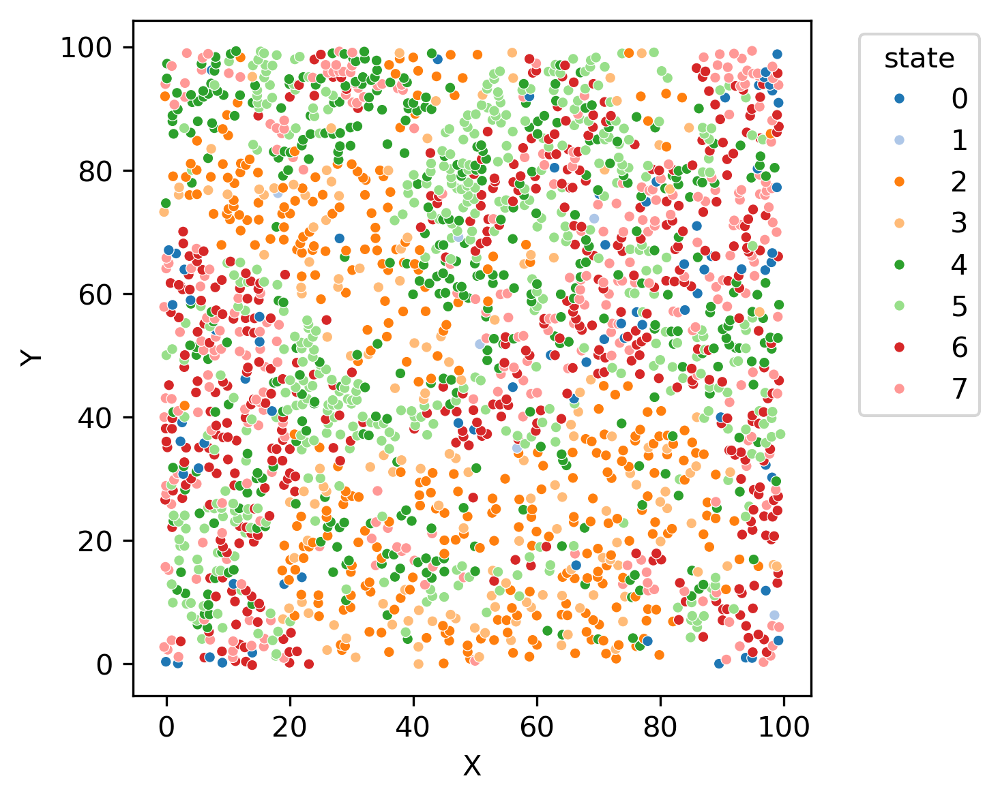

In [2]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=3, n_state=8, seed=42)

sim1 = ss.util.sim_from_params(
    param_1,
    shape=shape,
    num_iteration=4,
    n_iter=6,
    custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'),
    seed=0
)

sim1.plot(figsize=(5, 5), dpi=300, size=14)

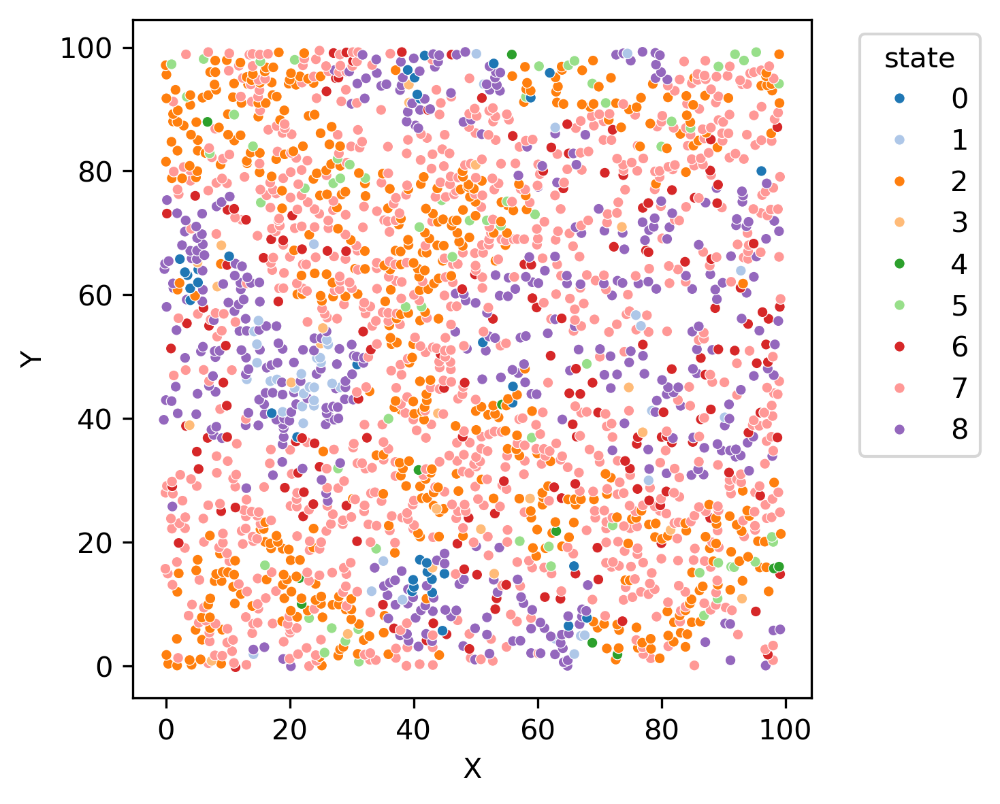

In [4]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=2, n_state=9, seed=42)

sim1 = ss.util.sim_from_params(
    param_1,
    shape=shape,
    num_iteration=4,
    n_iter=6,
    custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'),
    seed=0
)

sim1.plot(figsize=(5, 5), dpi=300, size=14)

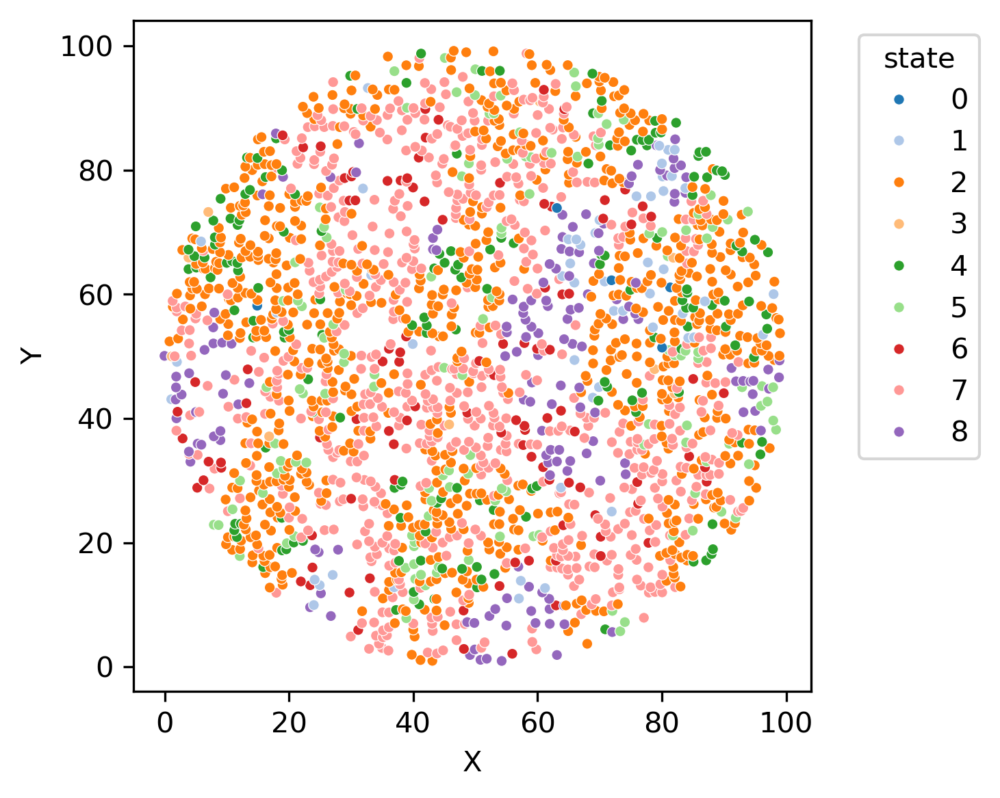

In [6]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=3, n_state=9, seed=42)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
if n_state * (n_state - 1) != 2 * diag_length:
    raise ValueError("Invalid theta matrix size.")

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize()   # Initialize the grid
x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
distance_from_center = np.sqrt((x - shape[1] // 2)**2 + (y - shape[0] // 2)**2)
Sim.grid[distance_from_center > 50] = -1
Sim.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
Sim.plot(figsize=(5, 5), dpi=300, size=14)

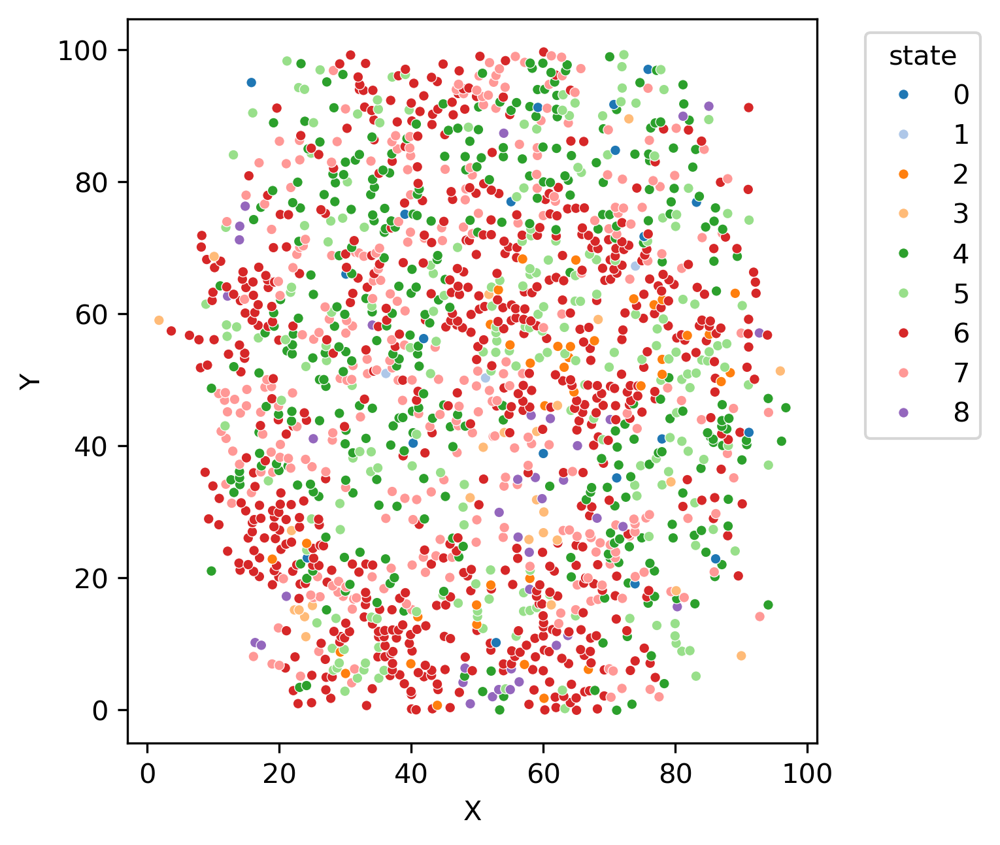

In [7]:
shape = (100, 100)
param_1 = ss.util.generate_random_parameters(n_group=3, n_state=9, seed=1111)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
if n_state * (n_state - 1) != 2 * diag_length:
    raise ValueError("Invalid theta matrix size.")

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize()   # Initialize the grid

x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
distance_from_center = np.sqrt((x - shape[1] // 2)**2 + (y - shape[0] // 2)**2)

# Introduce anisotropy by scaling x and y differently
anisotropy_factor_x = 1.2  # Stretch in x-direction
anisotropy_factor_y = 0.8  # Compress in y-direction
anisotropic_distance = np.sqrt(((x - shape[1] // 2) * anisotropy_factor_x)**2 + 
                                ((y - shape[0] // 2) * anisotropy_factor_y)**2)

random_noise = np.random.normal(0, 5, size=anisotropic_distance.shape)
irregular_shape = anisotropic_distance + random_noise
Sim.grid[irregular_shape > 50] = -1

Sim.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
Sim.plot(figsize=(5, 5), dpi=300, size=14)

# Fig. 2C: Example of reference-free omics simulation

In [2]:
shape = (100, 100)
param_1 =ss.util.generate_random_parameters(n_group=3, n_state=9, seed=42)

n_group = param_1['n_group']
diag_length = len(param_1['theta_list'][0])
n_state = int((1 + np.sqrt(1 + 8 * diag_length)) / 2)
if n_state * (n_state - 1) != 2 * diag_length:
    raise ValueError("Invalid theta matrix size.")

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = param_1['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = param_1['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(param_1['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = param_1['phi_replicates']

Sim = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= 4,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=ss.spatial.generate_offsets(3, 'manhattan'), 
    random_seed=42,
    )
Sim.initialize()   # Initialize the grid
x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
distance_from_center = np.sqrt((x - shape[1] // 2)**2 + (y - shape[0] // 2)**2)
Sim.grid[distance_from_center > 50] = -1
Sim.create_niche(num_niches=n_group, n_iter=6, theta_niche=niche_theta)
Sim.gibbs_sampler()    # Gibbs sampling
Sim.density_sampler(density_replicates)  # Cell density of each niche
Sim.perturbation(step = 0.2)
# Sim.plot_long(figsize=(5, 5), dpi=300, size=14)

In [ ]:
Sim.create_omics(n_genes=1000, bg_ratio=0.6, bg_param = (1, 0.5), marker_param = (3.5, 1.6), spatial=False)

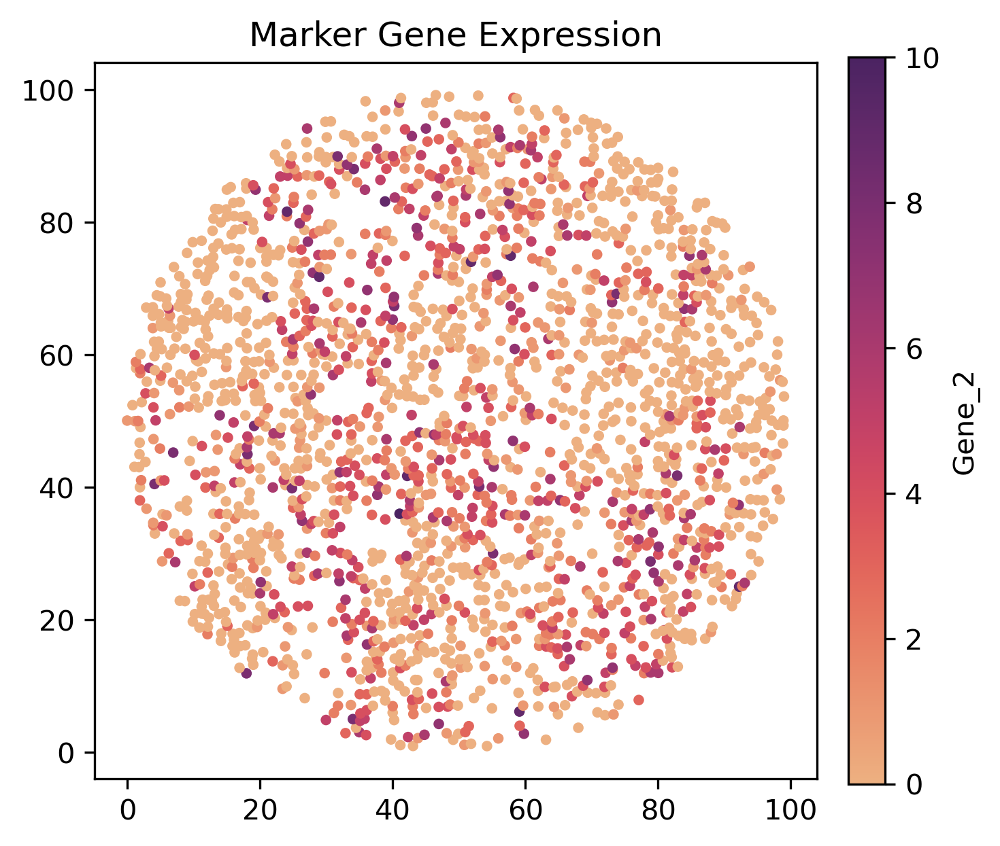

In [ ]:
ss.plot.plot_gene(Sim.meta, Sim.omics['Gene_2'], size=14, 
          figsize=(5,5), dpi=300, title='Marker Gene Expression',)

# Fig. 2D: Benchmarking reference-free simulation methods

In [2]:
def ripley_K_simple(points, grid_size, radii):
    """
    Uncorrected Ripley's K for a rectangular window using cKDTree.
    
    points: (N,2) array of [x,y]
    window: (xmin, xmax, ymin, ymax)
    radii : 1D array of r values (ascending)
    
    Returns: K(r) array same shape as radii
    """
    points = np.asarray(points, float)
    radii  = np.asarray(radii, float)
    n = len(points)
    if n < 2:
        return np.zeros_like(radii)

    A = grid_size ** 2

    # build once and get all unordered pairs up to max r
    rmax = float(radii.max())
    tree = cKDTree(points)
    pairs = list(tree.query_pairs(rmax))  # list of (i,j) with i<j
    if not pairs:
        return np.zeros_like(radii)

    # pairwise distances for those pairs
    p = np.array(pairs, dtype=int)
    d = np.hypot(points[p[:,0],0] - points[p[:,1],0],
                 points[p[:,0],1] - points[p[:,1],1])

    # sort once → cumulative counts
    order = np.argsort(d)
    d_sorted = d[order]
    cum_pairs = np.arange(1, len(d_sorted)+1)  # 1..m

    # for each r, number of pairs with d <= r
    K = np.zeros_like(radii, dtype=float)
    factor = A / (n * (n - 1)) * 2.0  # ×2 because sum_{i≠j} counts both directions
    for k, r in enumerate(radii):
        idx = np.searchsorted(d_sorted, r, side='right') - 1
        if idx >= 0:
            K[k] = factor * cum_pairs[idx]
    return K

def ripley_L_simple(points, grid_size):
    radii = np.linspace(0, grid_size/4, 25)
    K = ripley_K_simple(points, grid_size, radii)
    L = np.sqrt(K / pi)  # often plot L(r) - r
    return L - radii

def ss_statistics(
        shape = (100, 100), 
        n_group = 3, 
        n_state = 9, 
        num_iteration = 4, 
        n_iter = 6, 
        custom_neighbor = ss.spatial.generate_offsets(3, 'manhattan'),
        seed = 0,   
    ):
    param_1 = ss.util.generate_random_parameters(n_group=n_group, n_state=n_state, seed=seed)
    sim1 = ss.util.sim_from_params(
        param_1,
        shape=shape,
        num_iteration=num_iteration,
        n_iter=n_iter,
        custom_neighbor=custom_neighbor,
        seed=seed
    )  

    mi_sim = ss.spatial.integrate_morans_I(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    ci_sim = ss.spatial.calculate_interaction_score(sim1.meta['state'], sim1.meta[['row', 'col']], sim1.meta['state'].unique().tolist())
    lfunc_sim = ripley_L_simple(sim1.meta[['col', 'row']].values, shape[0])

    return [mi_sim, gc_sim, ci_sim, lfunc_sim]

In [4]:
sim_stats_list = []
Xenium_stats_list = []
merfish_stats_list = []
sccube_stats_list = []
SRTsim_stats_list = []
scMultiSim_stats_list = []
random_control_list = []
for i in range(8):
    ## SimSpace
    sim_stats = ss_statistics(
        shape=(100, 100), n_group=2, n_state=9, num_iteration=4, n_iter=6, 
        custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'), seed=i)
    sim_stats_list.append(sim_stats)
    ## Xenium
    tile_path = f'../fig_data/MI/tile_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    mi_sim = ss.spatial.integrate_morans_I(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    cells['x_centroid'] = (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min()) * 100
    cells['y_centroid'] = (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cluster'], cells[['x_centroid', 'y_centroid']], cells['Cluster'].unique().tolist())
    L_sim = ripley_L_simple(cells[['x_centroid', 'y_centroid']].values, 100)
    Xenium_stats_list.append([mi_sim, gc_sim, ci_sim, L_sim])
    ## Negative control, where the spatial coordinates are randomized
    tile_path = f'../fig_data/MI/tile_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    np.random.seed(i)
    cells['rand_x'] = np.random.permutation(cells['x_centroid'].values)
    cells['rand_y'] = np.random.permutation(cells['y_centroid'].values)
    mi_rand = ss.spatial.integrate_morans_I(cells['Cluster'], cells[['rand_x', 'rand_y']], cells['Cluster'].unique().tolist())
    gc_rand = ss.spatial.integrate_gearys_C(cells['Cluster'], cells[['rand_x', 'rand_y']], cells['Cluster'].unique().tolist())
    cells['x_centroid'] = (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min()) * 100
    cells['y_centroid'] = (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min()) * 100
    ci_rand = ss.spatial.calculate_interaction_score(cells['Cluster'], cells[['rand_x', 'rand_y']], cells['Cluster'].unique().tolist())
    L_rand = ripley_L_simple(cells[['rand_x', 'rand_y']].values, 100)
    random_control_list.append([mi_rand, gc_rand, ci_rand, L_rand])
    ## scCube
    tile_path = f'../fig_data/MI/sc_meta_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    mi_sim = ss.spatial.integrate_morans_I(cells['Cell_type'], cells[['point_x', 'point_y']], cells['Cell_type'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['Cell_type'], cells[['point_x', 'point_y']], cells['Cell_type'].unique().tolist())
    cells['point_x'] = (cells['point_x'] - cells['point_x'].min()) / (cells['point_x'].max() - cells['point_x'].min()) * 100
    cells['point_y'] = (cells['point_y'] - cells['point_y'].min()) / (cells['point_y'].max() - cells['point_y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cell_type'], cells[['point_x', 'point_y']], cells['Cell_type'].unique().tolist())
    L_sim = ripley_L_simple(cells[['point_x', 'point_y']].values, 100)
    sccube_stats_list.append([mi_sim, gc_sim, ci_sim, L_sim])
    ## SRTsim   
    tile_path = f'../fig_data/SRTsim/ref_free_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    mi_sim = ss.spatial.integrate_morans_I(cells['group'], cells[['x', 'y']], cells['group'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['group'], cells[['x', 'y']], cells['group'].unique().tolist())
    cells['x'] = (cells['x'] - cells['x'].min()) / (cells['x'].max() - cells['x'].min()) * 100
    cells['y'] = (cells['y'] - cells['y'].min()) / (cells['y'].max() - cells['y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['group'], cells[['x', 'y']], cells['group'].unique().tolist())
    L_sim = ripley_L_simple(cells[['x', 'y']].values, 100)
    SRTsim_stats_list.append([mi_sim, gc_sim, ci_sim, L_sim])
    ## scMultiSim
    tile_path = f'../fig_data/scMultiSim/spatial_sim_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    mi_sim = ss.spatial.integrate_morans_I(cells['cell.type'], cells[['x', 'y']], cells['cell.type'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['cell.type'], cells[['x', 'y']], cells['cell.type'].unique().tolist())
    cells['x'] = (cells['x'] - cells['x'].min()) / (cells['x'].max() - cells['x'].min()) * 100
    cells['y'] = (cells['y'] - cells['y'].min()) / (cells['y'].max() - cells['y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['cell.type'], cells[['x', 'y']], cells['cell.type'].unique().tolist())
    L_sim = ripley_L_simple(cells[['x', 'y']].values, 100)
    scMultiSim_stats_list.append([mi_sim, gc_sim, ci_sim, L_sim])
    ## MERFISH
    tile_path = f'../fig_data/MERFISH/merfish_data_sample_{i}.csv'
    cells = pd.read_csv(tile_path, index_col=None)
    mi_sim = ss.spatial.integrate_morans_I(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    gc_sim = ss.spatial.integrate_gearys_C(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    cells['Centroid_X'] = (cells['Centroid_X'] - cells['Centroid_X'].min()) / (cells['Centroid_X'].max() - cells['Centroid_X'].min()) * 100
    cells['Centroid_Y'] = (cells['Centroid_Y'] - cells['Centroid_Y'].min()) / (cells['Centroid_Y'].max() - cells['Centroid_Y'].min()) * 100
    ci_sim = ss.spatial.calculate_interaction_score(cells['Cell_class'], cells[['Centroid_X', 'Centroid_Y']], cells['Cell_class'].unique().tolist())
    L_sim = ripley_L_simple(cells[['Centroid_X', 'Centroid_Y']].values, 100)
    merfish_stats_list.append([mi_sim, gc_sim, ci_sim, L_sim])

In [ ]:
## MI
sim_mi = np.sort(np.concatenate([item[0] for item in sim_stats_list]))
xenium_mi = np.sort(np.concatenate([item[0] for item in Xenium_stats_list]))
sccube_mi = np.sort(np.concatenate([item[0] for item in sccube_stats_list]))
srt_mi = np.sort(np.concatenate([item[0] for item in SRTsim_stats_list]))
scMultiSim_mi = np.sort(np.concatenate([item[0] for item in scMultiSim_stats_list]))
merfish_mi = np.sort(np.concatenate([item[0] for item in merfish_stats_list]))
rand_mi = np.sort(np.concatenate([item[0] for item in random_control_list]))
## CDF
xenium_cdf = np.arange(1, len(xenium_mi) + 1) / len(xenium_mi)
sim_cdf = np.arange(1, len(sim_mi) + 1) / len(sim_mi)
sccube_cdf = np.arange(1, len(sccube_mi) + 1) / len(sccube_mi)
srt_cdf = np.arange(1, len(srt_mi) + 1) / len(srt_mi)
scMultiSim_cdf = np.arange(1, len(scMultiSim_mi) + 1) / len(scMultiSim_mi)
merfish_cdf = np.arange(1, len(merfish_mi) + 1) / len(merfish_mi)
rand_cdf = np.arange(1, len(rand_mi) + 1) / len(rand_mi)

plt.figure(figsize=(6, 3), dpi=300)
palette = sns.color_palette("muted", 6)

sns.lineplot(x=xenium_mi, y=xenium_cdf, label='Xenium (Real)', color=palette[0], linewidth=1.5)
sns.lineplot(x=merfish_mi, y=merfish_cdf, label='MERFISH (Real)', color=palette[1], linewidth=1.5)
sns.lineplot(x=sim_mi, y=sim_cdf, label='SimSpace', color=palette[2], linewidth=1.5)

sns.lineplot(x=sccube_mi, y=sccube_cdf, label='scCube', color=palette[3], linewidth=0.75)
sns.lineplot(x=srt_mi, y=srt_cdf, label='SRTsim', color=palette[4], linewidth=0.75)
sns.lineplot(x=scMultiSim_mi, y=scMultiSim_cdf, label='scMultiSim', color=palette[5], linewidth=0.75)
sns.lineplot(x=rand_mi, y=rand_cdf, label='Randomized Control', color='gray', linestyle='--', linewidth=1.0)

plt.xlabel('Moran\'s Index')
plt.ylabel('CDF')
plt.title('CDF of Moran\'s Index')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

In [ ]:
## GC
sim_gc = np.sort(np.concatenate([item[1] for item in sim_stats_list]))
xenium_gc = np.sort(np.concatenate([item[1] for item in Xenium_stats_list]))
sccube_gc = np.sort(np.concatenate([item[1] for item in sccube_stats_list]))
srt_gc = np.sort(np.concatenate([item[1] for item in SRTsim_stats_list]))
scMultiSim_gc = np.sort(np.concatenate([item[1] for item in scMultiSim_stats_list]))
merfish_gc = np.sort(np.concatenate([item[1] for item in merfish_stats_list]))
rand_gc = np.sort(np.concatenate([item[1] for item in random_control_list]))
## CDF
gc_xenium_cdf = np.arange(1, len(xenium_gc) + 1) / len(xenium_gc)
gc_sim_cdf = np.arange(1, len(sim_gc) + 1) / len(sim_gc)
gc_sccube_cdf = np.arange(1, len(sccube_gc) + 1) / len(sccube_gc)
gc_srt_cdf = np.arange(1, len(srt_gc) + 1) / len(srt_gc)
gc_scMultiSim_cdf = np.arange(1, len(scMultiSim_gc) + 1) / len(scMultiSim_gc)
gc_merfish_cdf = np.arange(1, len(merfish_gc) + 1) / len(merfish_gc)

plt.figure(figsize=(6, 3), dpi=300)
palette = sns.color_palette("muted", 6)
sns.lineplot(x=xenium_gc, y=gc_xenium_cdf, label='Xenium (Real)', color=palette[0], linewidth=1.5)
sns.lineplot(x=merfish_gc, y=gc_merfish_cdf, label='MERFISH (Real)', color=palette[1], linewidth=1.5)
sns.lineplot(x=sim_gc, y=gc_sim_cdf, label='SimSpace', color=palette[2], linewidth=1.5)
sns.lineplot(x=sccube_gc, y=gc_sccube_cdf, label='scCube', color=palette[3], linewidth=0.75)
sns.lineplot(x=srt_gc, y=gc_srt_cdf, label='SRTsim', color=palette[4], linewidth=0.75)
sns.lineplot(x=scMultiSim_gc, y=gc_scMultiSim_cdf, label='scMultiSim', color=palette[5], linewidth=0.75)
plt.xlabel('Geary\'s Contiguity Ratio')
plt.ylabel('CDF')
plt.title('CDF of Geary\'s C')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

In [ ]:
## L function
sim_L_arr = np.array([item[3] for item in sim_stats_list])
xenium_L_arr = np.array([item[3] for item in Xenium_stats_list])
sccube_L_arr = np.array([item[3] for item in sccube_stats_list])
srt_L_arr = np.array([item[3] for item in SRTsim_stats_list])
scMultiSim_L_arr = np.array([item[3] for item in scMultiSim_stats_list])
merfish_L_arr = np.array([item[3] for item in merfish_stats_list])
rand_L_arr = np.array([item[3] for item in random_control_list])
sim_L_arr = np.mean(sim_L_arr, axis=0)
xenium_L_arr = np.mean(xenium_L_arr, axis=0)
sccube_L_arr = np.mean(sccube_L_arr, axis=0)
srt_L_arr = np.mean(srt_L_arr, axis=0)
scMultiSim_L_arr = np.mean(scMultiSim_L_arr, axis=0)
merfish_L_arr = np.mean(merfish_L_arr, axis=0)
rand_L_arr = np.mean(rand_L_arr, axis=0)

plt.figure(figsize=(6, 3), dpi=300)
palette = sns.color_palette("muted", 6)
radii = np.linspace(0, 25, 25)
sns.lineplot(x=radii, y=xenium_L_arr, label='Xenium (Real)', color=palette[0], linewidth=1.5)
sns.lineplot(x=radii, y=merfish_L_arr, label='MERFISH (Real)', color=palette[1], linewidth=1.5)
sns.lineplot(x=radii, y=sim_L_arr, label='SimSpace', color=palette[2], linewidth=1.5)
sns.lineplot(x=radii, y=sccube_L_arr, label='scCube', color=palette[3], linewidth=0.75)
sns.lineplot(x=radii, y=srt_L_arr, label='SRTsim', color=palette[4], linewidth=0.75)
sns.lineplot(x=radii, y=scMultiSim_L_arr, label='scMultiSim', color=palette[5], linewidth=0.75)
plt.xlabel('Distance (r)')
plt.ylabel('L(r) - r')
plt.title('Ripley\'s L Function')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

In [ ]:
## Cell Type Interaction
sim_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in sim_stats_list]))
xenium_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in Xenium_stats_list]))
sccube_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in sccube_stats_list]))
srt_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in SRTsim_stats_list]))
scMultiSim_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in scMultiSim_stats_list]))
merfish_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in merfish_stats_list]))
rand_ci = np.sort(np.concatenate([item[2].values.reshape(-1).tolist() for item in random_control_list]))
## CDF
ci_xenium_cdf = np.arange(1, len(xenium_ci) + 1) / len(xenium_ci)
ci_sim_cdf = np.arange(1, len(sim_ci) + 1) / len(sim_ci)
ci_sccube_cdf = np.arange(1, len(sccube_ci) + 1) / len(sccube_ci)
ci_srt_cdf = np.arange(1, len(srt_ci) + 1) / len(srt_ci)
ci_scMultiSim_cdf = np.arange(1, len(scMultiSim_ci) + 1) / len(scMultiSim_ci)
ci_merfish_cdf = np.arange(1, len(merfish_ci) + 1) / len(merfish_ci)
ci_rand_cdf = np.arange(1, len(rand_ci) + 1) / len(rand_ci)

plt.figure(figsize=(6, 3), dpi=300)
palette = sns.color_palette("muted", 6)
sns.lineplot(x=xenium_ci, y=ci_xenium_cdf, label='Xenium (Real)', color=palette[0], linewidth=1.5)
sns.lineplot(x=merfish_ci, y=ci_merfish_cdf, label='MERFISH (Real)', color=palette[1], linewidth=1.5)
sns.lineplot(x=sim_ci, y=ci_sim_cdf, label='SimSpace', color=palette[2], linewidth=1.5)
sns.lineplot(x=sccube_ci, y=ci_sccube_cdf, label='scCube', color=palette[3], linewidth=0.75)
sns.lineplot(x=srt_ci, y=ci_srt_cdf, label='SRTsim', color=palette[4], linewidth=0.75)
sns.lineplot(x=scMultiSim_ci, y=ci_scMultiSim_cdf, label='scMultiSim', color=palette[5], linewidth=0.75)
plt.xlabel('Cell Type Interaction Score')
plt.ylabel('CDF')
plt.title('CDF of Cell Type Interaction Score')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6), dpi=300)
palette = sns.color_palette("muted", 6)
radii_ = radii  # already defined

# Panel 1: Moran's I CDF
axs[0, 0].plot(np.sort(xenium_mi), np.arange(1, len(xenium_mi)+1)/len(xenium_mi), label='Xenium (Real)', color=palette[0], linewidth=1.5)
axs[0, 0].plot(np.sort(merfish_mi), np.arange(1, len(merfish_mi)+1)/len(merfish_mi), label='MERFISH (Real)', color=palette[1], linewidth=1.5)
axs[0, 0].plot(np.sort(sim_mi), np.arange(1, len(sim_mi)+1)/len(sim_mi), label='SimSpace', color=palette[2], linewidth=1.5)
axs[0, 0].plot(np.sort(sccube_mi), np.arange(1, len(sccube_mi)+1)/len(sccube_mi), label='scCube', color=palette[3], linewidth=0.75)
axs[0, 0].plot(np.sort(srt_mi), np.arange(1, len(srt_mi)+1)/len(srt_mi), label='SRTsim', color=palette[4], linewidth=0.75)
axs[0, 0].plot(np.sort(scMultiSim_mi), np.arange(1, len(scMultiSim_mi)+1)/len(scMultiSim_mi), label='scMultiSim', color=palette[5], linewidth=0.75)
axs[0, 0].set_xlabel("Moran's Index")
axs[0, 0].set_ylabel("CDF")
axs[0, 0].set_title("CDF of Moran's Index")

# Panel 2: Ripley's L function
axs[0, 1].plot(radii_, xenium_L_arr, label='Xenium (Real)', color=palette[0], linewidth=1.5)
axs[0, 1].plot(radii_, merfish_L_arr, label='MERFISH (Real)', color=palette[1], linewidth=1.5)
axs[0, 1].plot(radii_, sim_L_arr, label='SimSpace', color=palette[2], linewidth=1.5)
axs[0, 1].plot(radii_, sccube_L_arr, label='scCube', color=palette[3], linewidth=0.75)
axs[0, 1].plot(radii_, srt_L_arr, label='SRTsim', color=palette[4], linewidth=0.75)
axs[0, 1].plot(radii_, scMultiSim_L_arr, label='scMultiSim', color=palette[5], linewidth=0.75)
axs[0, 1].set_xlabel('Distance (r)')
axs[0, 1].set_ylabel("L(r) - r")
axs[0, 1].set_title("Ripley's L Function")

# Panel 3: Cell Type Interaction Score CDF
axs[1, 0].plot(np.sort(xenium_ci), np.arange(1, len(xenium_ci)+1)/len(xenium_ci), label='Xenium (Real)', color=palette[0], linewidth=1.5)
axs[1, 0].plot(np.sort(merfish_ci), np.arange(1, len(merfish_ci)+1)/len(merfish_ci), label='MERFISH (Real)', color=palette[1], linewidth=1.5)
axs[1, 0].plot(np.sort(sim_ci), np.arange(1, len(sim_ci)+1)/len(sim_ci), label='SimSpace', color=palette[2], linewidth=1.5)
axs[1, 0].plot(np.sort(sccube_ci), np.arange(1, len(sccube_ci)+1)/len(sccube_ci), label='scCube', color=palette[3], linewidth=0.75)
axs[1, 0].plot(np.sort(srt_ci), np.arange(1, len(srt_ci)+1)/len(srt_ci), label='SRTsim', color=palette[4], linewidth=0.75)
axs[1, 0].plot(np.sort(scMultiSim_ci), np.arange(1, len(scMultiSim_ci)+1)/len(scMultiSim_ci), label='scMultiSim', color=palette[5], linewidth=0.75)
axs[1, 0].set_xlabel('Cell Type Interaction Score')
axs[1, 0].set_ylabel('CDF')
axs[1, 0].set_title('CDF of Cell Type Interaction Score')

# Panel 4: Geary's C CDF
axs[1, 1].plot(np.sort(xenium_gc), np.arange(1, len(xenium_gc)+1)/len(xenium_gc), label='Xenium (Real)', color=palette[0], linewidth=1.5)
axs[1, 1].plot(np.sort(merfish_gc), np.arange(1, len(merfish_gc)+1)/len(merfish_gc), label='MERFISH (Real)', color=palette[1], linewidth=1.5)
axs[1, 1].plot(np.sort(sim_gc), np.arange(1, len(sim_gc)+1)/len(sim_gc), label='SimSpace', color=palette[2], linewidth=1.5)
axs[1, 1].plot(np.sort(sccube_gc), np.arange(1, len(sccube_gc)+1)/len(sccube_gc), label='scCube', color=palette[3], linewidth=0.75)
axs[1, 1].plot(np.sort(srt_gc), np.arange(1, len(srt_gc)+1)/len(srt_gc), label='SRTsim', color=palette[4], linewidth=0.75)
axs[1, 1].plot(np.sort(scMultiSim_gc), np.arange(1, len(scMultiSim_gc)+1)/len(scMultiSim_gc), label='scMultiSim', color=palette[5], linewidth=0.75)
axs[1, 1].set_xlabel("Geary's Contiguity Ratio")
axs[1, 1].set_ylabel("CDF")
axs[1, 1].set_title("CDF of Geary's C")

# Shared legend
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 0.95), frameon=False)
plt.tight_layout()
plt.show()

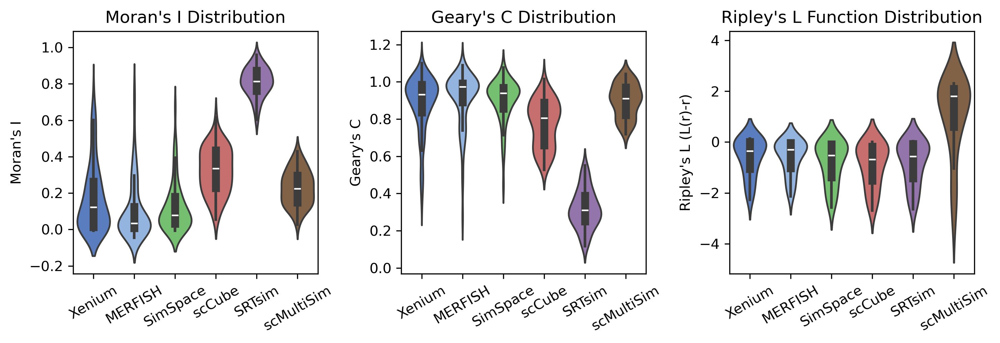

In [10]:
fig, axs = plt.subplots(1, 3, figsize=(10, 3.5), dpi=300)
palette = sns.color_palette("muted", 6)
palette = list(palette)
first = np.array(palette[0])
# blend the first color toward a light blue and set as the second color
palette[1] = tuple(np.clip(first * 0.4 + np.array([0.7, 0.85, 1.0]) * 0.6, 0, 1))

# Prepare data for violin plots
mi_data = [
    xenium_mi, merfish_mi, sim_mi, sccube_mi, srt_mi, scMultiSim_mi, 
]
mi_labels = ['Xenium', 'MERFISH', 'SimSpace', 'scCube', 'SRTsim', 'scMultiSim']

gc_data = [
    xenium_gc, merfish_gc, sim_gc, sccube_gc, srt_gc, scMultiSim_gc
]
gc_labels = mi_labels

ci_data = [
    xenium_ci, merfish_ci, sim_ci, sccube_ci, srt_ci, scMultiSim_ci
]
ci_labels = mi_labels

L_data = [
    xenium_L_arr, merfish_L_arr, sim_L_arr, sccube_L_arr, srt_L_arr, scMultiSim_L_arr
]
L_labels = mi_labels

# Panel 1: Moran's I
sns.violinplot(data=mi_data, ax=axs[0], palette=palette)
axs[0].set_xticklabels(mi_labels, rotation=30, ha='center')
axs[0].set_ylabel("Moran's I")
axs[0].set_title("Moran's I Distribution")

# # Panel Extra: Cell Type Interaction Score
# sns.violinplot(data=ci_data, ax=axs[1, 0], palette=palette)
# axs[1, 0].set_xticklabels(ci_labels, rotation=30, ha='center')
# axs[1, 0].set_ylabel("Cell Type Interaction Score")
# axs[1, 0].set_title("Cell Type Interaction Score Distribution")

# Panel 2: Geary's C
sns.violinplot(data=gc_data, ax=axs[1], palette=palette)
axs[1].set_xticklabels(gc_labels, rotation=30, ha='center')
axs[1].set_ylabel("Geary's C")
axs[1].set_title("Geary's C Distribution")

# Panel 3: Ripley's L (show as distribution at r=12, or mean across r)
L_r_idx = len(sim_L_arr) // 2  # middle radius
L_violin = [arr[L_r_idx] if arr.ndim == 1 else np.mean(arr) for arr in L_data]
sns.violinplot(data=[arr for arr in L_data], ax=axs[2], palette=palette)
axs[2].set_xticklabels(L_labels, rotation=30, ha='center')
axs[2].set_ylabel("Ripley's L (L(r)-r)")
axs[2].set_title("Ripley's L Function Distribution")

plt.tight_layout()
plt.show()

# Fig. 2E, F: 3-dimensional example

In [2]:
shape = (100, 100, 40)
num_iteration = 5
custom_neighbor = ss.spatial.generate_offsets3D(4, 'manhattan')

# parameters = load_parameters_from_json('/Users/zhaotianxiao/Library/CloudStorage/Dropbox/FenyoLab/Project/Spatialsim/output/best_solution_breast_23_0331_sparse.json')
parameters = ss.util.generate_random_parameters(n_group=3, n_state=8, seed=42)
n_state = parameters['n_state']
n_group = parameters['n_group']

niche_theta = np.zeros((n_group, n_group))
niche_theta[np.triu_indices(n_group, 1)] = parameters['niche_theta']
niche_theta = niche_theta + niche_theta.T - np.diag(niche_theta.diagonal())
np.fill_diagonal(niche_theta, 1)

theta_list = []
for i in range(n_group):
    theta_tmp = np.zeros((n_state, n_state))
    theta_tmp[np.triu_indices(n_state, 1)] = parameters['theta_list'][i]
    theta_tmp = theta_tmp + theta_tmp.T - np.diag(theta_tmp.diagonal())
    np.fill_diagonal(theta_tmp, 1)
    theta_list.append(theta_tmp)

density_replicates = np.array(parameters['density_replicates'])
density_replicates[density_replicates < 0] = 0
phi_replicates = parameters['phi_replicates']

Sim1 = ss.SimSpace(
    shape = shape,
    num_states = n_state,
    num_iterations= num_iteration,
    theta=theta_list,
    phi=phi_replicates,
    neighborhood=custom_neighbor, 
    random_seed=0)
Sim1.initialize3D()   # Initialize the grid
Sim1.create_niche3D(num_niches=n_group, n_iter=4, theta_niche=niche_theta)
Sim1.gibbs_sampler3D()    # Gibbs sampling
Sim1.density_sampler(density_replicates)  # Cell density of each niche
Sim1.perturbation3D(step = 0.2)     # Perturbation

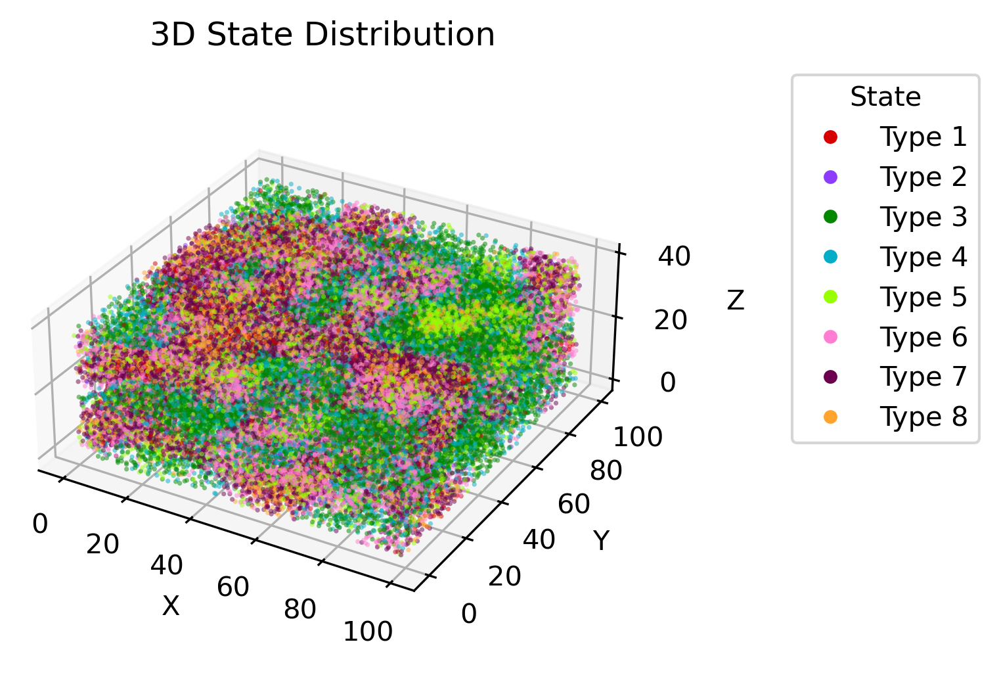

In [4]:
from matplotlib.lines import Line2D
import colorcet as cc

# Create a DataFrame for easier pslotting
df = pd.DataFrame(Sim1.meta, columns=['x', 'y', 'z', 'state'])
cmap = sns.color_palette(cc.glasbey, n_colors=8)
# cmap = sns.color_palette('tab20', n_colors=8)

# Plot the 3D scatter plot
fig = plt.figure(figsize=(6, 4), dpi=300)
ax = fig.add_subplot(111, projection='3d')
df['state'] = df['state'].astype('category')
scatter = ax.scatter(df['x'], df['y'], df['z'], c=df['state'].cat.codes, cmap=plt.cm.colors.ListedColormap(cmap), alpha=0.5, linewidths=0, s=3)
# Add legend for states
state_labels = [f'Type {cat + 1}' for cat in df['state'].cat.categories]
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label,
                          markerfacecolor=cmap[i], markersize=6)
                   for i, label in enumerate(state_labels)]
ax.legend(handles=legend_elements, title='State', bbox_to_anchor=(1.25, 1), loc='upper left')
ax.set_aspect('equal')
ax.set_zticks([0, 20, 40])

# Set labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_title('3D State Distribution')

plt.show()

In [5]:
Sim1.create_omics(n_genes=100, bg_ratio=0, bg_param = (1, 0.5), marker_param = (5, 2), spatial=False)

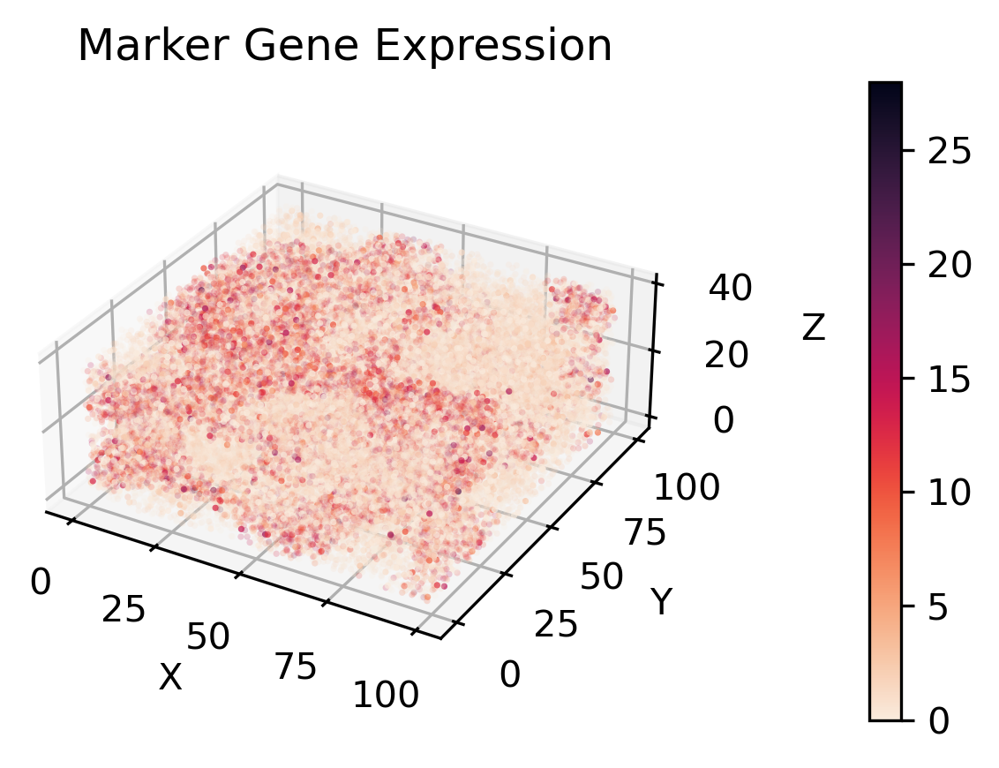

In [ ]:
df = pd.DataFrame(Sim1.meta, columns=['x', 'y', 'z', 'state'])
df['gene'] = Sim1.omics['Gene_48']
cmap = sns.color_palette('rocket_r', as_cmap=True)
df['alpha'] = df['gene']/df['gene'].max()
df['alpha'][df['alpha'] < 0.4] = 0.2
df['alpha'][df['alpha'] > 0.4] = 0.7

# Plot the 3D scatter plot
fig = plt.figure(figsize=(6, 3), dpi=300)
ax = fig.add_subplot(111, projection='3d')
df['state'] = df['state'].astype('category')
scatter = ax.scatter(df['x'], df['y'], df['z'], c=df['gene'], alpha=df['alpha'], linewidths=0, s=3, cmap=cmap)
# Add legend
cbar = plt.colorbar(scatter, ax=ax, fraction=0.046, pad=0.14)
# cbar.set_label(feature.name)
ax.set_aspect('equal')
ax.set_zticks([0, 20, 40])

# Set labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_title('Marker Gene Expression')
plt.tight_layout()
plt.show()

# Fig. 3B: Scatterplot of fitted simulation data: Original, SimSpace, scCube

### Xenium

In [2]:
cells = pd.read_csv("../data/reference_metadata.csv")
cell_counts = cells['Cluster'].value_counts()
cells = cells[cells['Cluster'].isin(cell_counts[cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(cells['Cluster'].value_counts().index, 1)}
cells['celltype_rank'] = cells['Cluster'].map(ranked_cell_types)

cells['x_centroid'] = 100 * (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min())
cells['y_centroid'] = 100 * (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min())

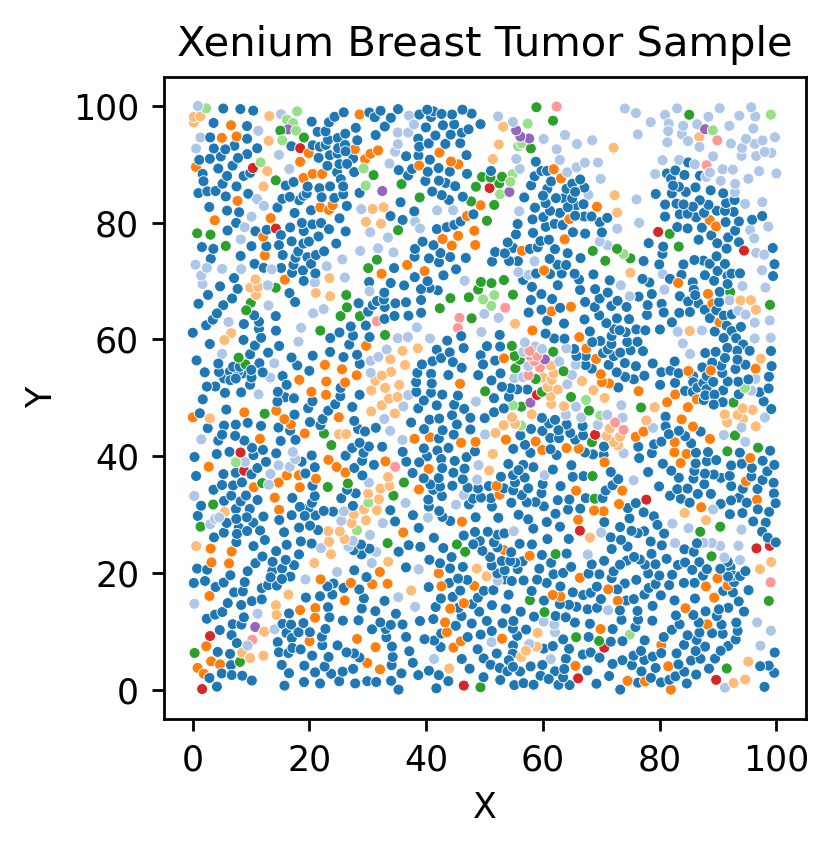

In [3]:
plt.figure(figsize=(5, 3.5), dpi = 250)
sns.scatterplot(x='x_centroid', y='y_centroid', data=cells, hue='celltype_rank', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# Map celltype_rank to Cluster labels for the legend
handles, labels = plt.gca().get_legend_handles_labels()
cluster_labels = {str(rank): cluster for cluster, rank in ranked_cell_types.items()}
new_labels = [cluster_labels.get(label, label) for label in labels]
# plt.legend(handles, new_labels, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('Xenium Breast Tumor Sample')
plt.tight_layout()
plt.show()

### scCube

In [6]:
sccube_cells = pd.read_csv("../fig_data/Xenium_Breast_scCube.csv",
                    index_col=0)
sccube_cell_counts = sccube_cells['Cell_type'].value_counts()
sccube_cells = sccube_cells[sccube_cells['Cell_type'].isin(sccube_cell_counts[sccube_cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(sccube_cells['Cell_type'].value_counts().index, 1)}
sccube_cells['celltype_rank'] = sccube_cells['Cell_type'].map(ranked_cell_types)

sccube_cells['point_x'] = 100 * (sccube_cells['point_x'] - sccube_cells['point_x'].min()) / (sccube_cells['point_x'].max() - sccube_cells['point_x'].min())
sccube_cells['point_y'] = 100 * (sccube_cells['point_y'] - sccube_cells['point_y'].min()) / (sccube_cells['point_y'].max() - sccube_cells['point_y'].min())

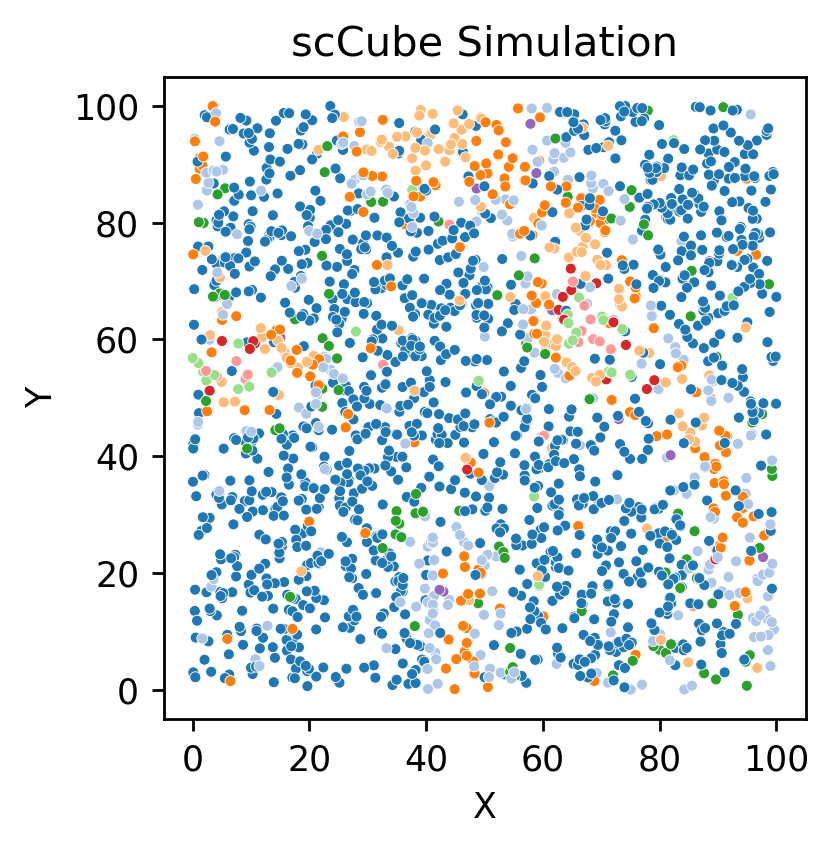

In [7]:
plt.figure(figsize=(5, 3.5), dpi = 250)
sns.scatterplot(x='point_x', y='point_y', data=sccube_cells, hue='celltype_rank', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('scCube Simulation')
plt.tight_layout()
plt.show()

### SimSpace

In [4]:
shape = (100, 100)
sim = ss.util.sim_from_json(
    input_file='../data/fitted_params.json',
    shape=shape,
    num_iteration=4,
    n_iter=6,
)

simulation = sim.meta.copy()
simulation.columns = ['celltype', 'x', 'y', 'spatial_domain', 'celltype_rank']

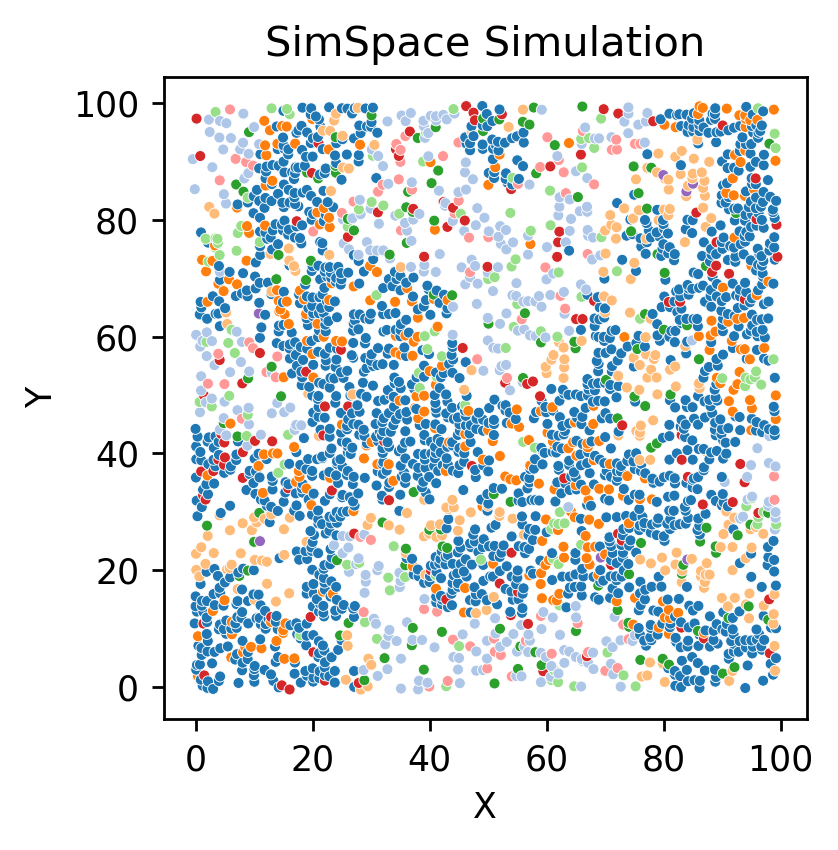

In [5]:
plt.figure(figsize=(5, 3.5), dpi = 250)
sns.scatterplot(x='x', y='y', data=simulation, hue='celltype_rank', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

# Fig. 3D, E: Spatial domain detection & analysis

In [2]:
shape = (100, 100)
sim = ss.util.sim_from_json(
    input_file='../data/fitted_params.json',
    shape=shape,
    num_iteration=4,
    n_iter=6,
)

simulation = sim.meta.copy()
simulation.columns = ['celltype', 'x', 'y', 'spatial_domain', 'celltype_rank']

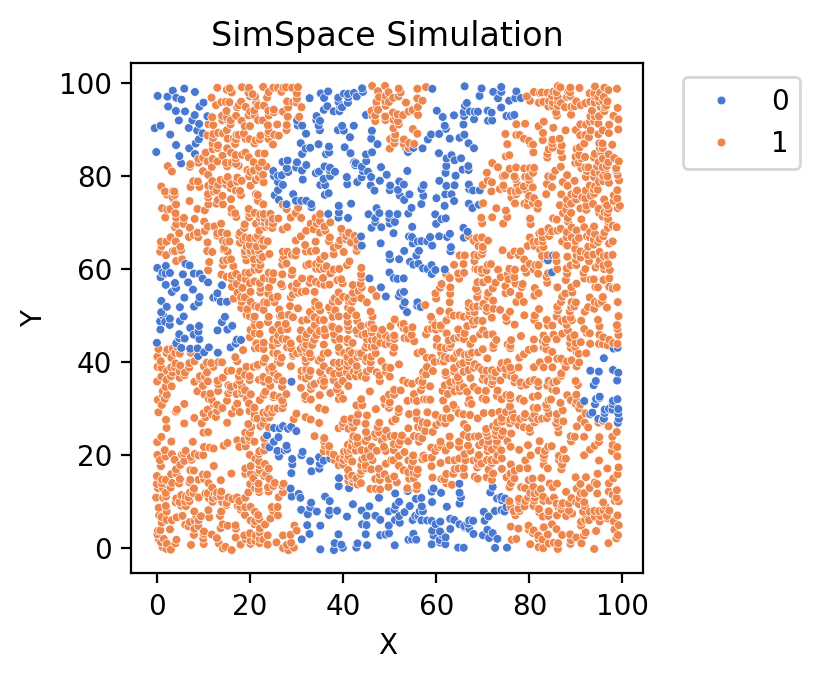

In [3]:
plt.figure(figsize=(5, 3.5), dpi = 200)
sns.scatterplot(x='x', y='y', data=simulation, hue='spatial_domain', palette='muted', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

In [3]:
bank_ss_domain = pd.read_csv('../fig_data/clustering/BANKSY_ss_domain.csv')

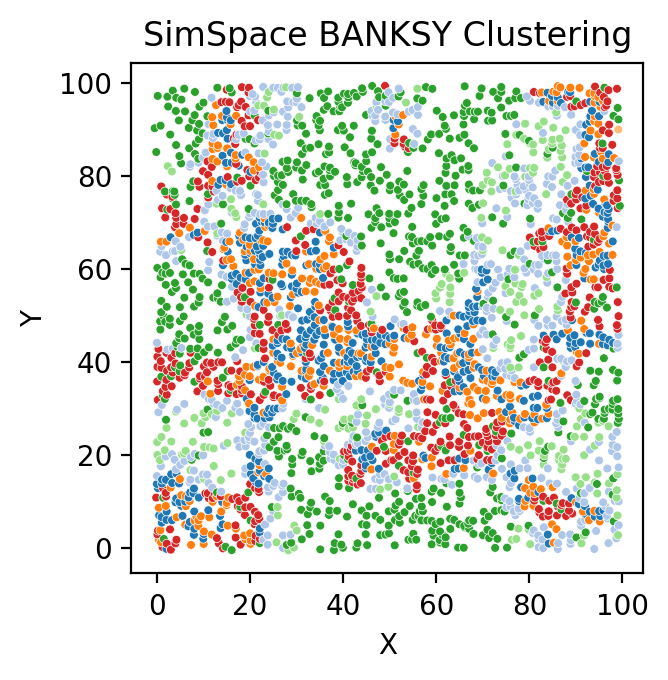

In [4]:
plt.figure(figsize=(5, 3.5), dpi = 200)
sns.scatterplot(x='row', y='col', data=bank_ss_domain, hue='UMAP1_cluster', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace BANKSY Clustering')
plt.tight_layout()
plt.show()

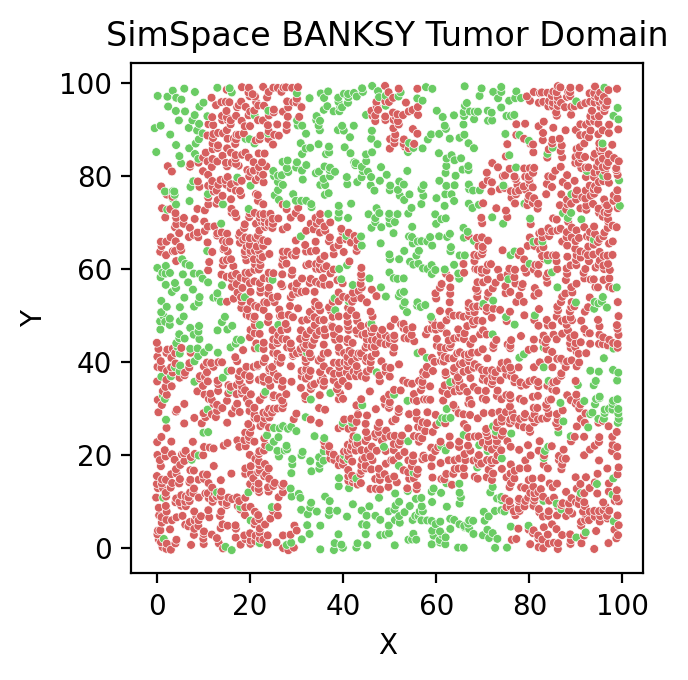

In [6]:
palette = sns.color_palette("muted", 10)
palette[0] = palette[3]
palette[1] = palette[2]

plt.figure(figsize=(5, 3.5), dpi = 200)
sns.scatterplot(x='row', y='col', data=bank_ss_domain, hue='Tumor_label', palette=palette, legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace BANKSY Tumor Domain')
plt.tight_layout()
plt.show()

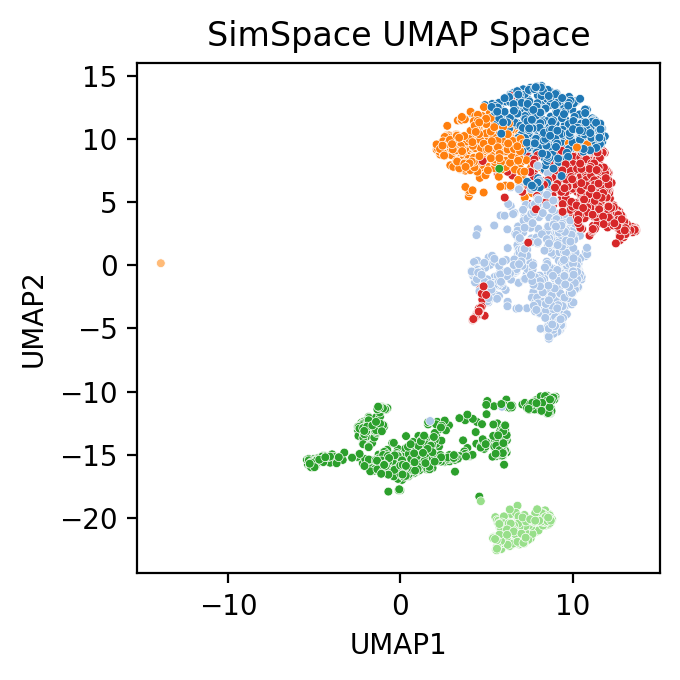

In [87]:
plt.figure(figsize=(3.5, 3.5), dpi = 200)
sns.scatterplot(x='UMAP1', y='UMAP2', data=bank_ss_domain, hue='UMAP1_cluster', palette='tab20', legend=True, s=10)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace UMAP Space')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(simulation['spatial_domain'], bank_ss_domain['Tumor_label'])
nmi = normalized_mutual_info_score(simulation['spatial_domain'], bank_ss_domain['Tumor_label'], average_method='arithmetic')

print(f"ARI = {ari:.3f}, NMI = {nmi:.3f}")

ARI = 0.690, NMI = 0.588


In [4]:
bank_xenium_domain = pd.read_csv('../fig_data/clustering/BANKSY_xenium_domain.csv')

In [5]:
# Compute domain-wise cell type composition for SimSpace (ss) and Xenium
ct_order = pd.concat([bank_ss_domain['fitted_celltype'], bank_xenium_domain['fitted_celltype']]) \
             .value_counts().index.tolist()

# Cross-tab and normalize by domain (rows sum to 1)
ct_ss = pd.crosstab(bank_ss_domain['Tumor_label'], bank_ss_domain['fitted_celltype'])
comp_ss = ct_ss.reindex(columns=ct_order, fill_value=0).div(ct_ss.sum(axis=1), axis=0)

ct_xen = pd.crosstab(bank_xenium_domain['Tumor_label'], bank_xenium_domain['fitted_celltype'])
comp_xen = ct_xen.reindex(columns=ct_order, fill_value=0).div(ct_xen.sum(axis=1), axis=0)

# Common scale for colorbar
vmax = max(comp_ss.max().max(), comp_xen.max().max())

# Create percent annotation matrices
annot_ss = comp_ss.applymap(lambda v: f"{v*100:.1f}%").values
annot_xen = comp_xen.applymap(lambda v: f"{v*100:.1f}%").values

In [ ]:
# Plot side-by-side heatmaps
fig, axes = plt.subplots(2, 1, figsize=(7, 5), dpi=250)
sns.heatmap(comp_ss, ax=axes[0], cmap='rocket_r', vmin=0, vmax=vmax,
            annot=annot_ss, fmt='', cbar=True, cbar_kws={'label': 'Fraction'})
axes[0].set_title('SimSpace: cell-type composition per domain')
axes[0].set_ylabel('Domain Cluster')
axes[0].set_xlabel(None)
axes[0].set_xticklabels([])  # Hide x-axis labels for the top heatmap

sns.heatmap(comp_xen, ax=axes[1], cmap='rocket_r', vmin=0, vmax=vmax,
            annot=annot_xen, fmt='', cbar=True, cbar_kws={'label': 'Fraction'})
axes[1].set_title('Xenium: cell-type composition per domain')
axes[1].set_ylabel('Domain Cluster')
axes[1].set_xlabel('Cell Type')
# Rotate and right-align x tick labels (set_xticks was used incorrectly)
axes[1].tick_params(axis='x', labelrotation=55)
for tl in axes[1].get_xticklabels():
    tl.set_ha('right')
    tl.set_rotation_mode('anchor')

plt.tight_layout()
plt.show()

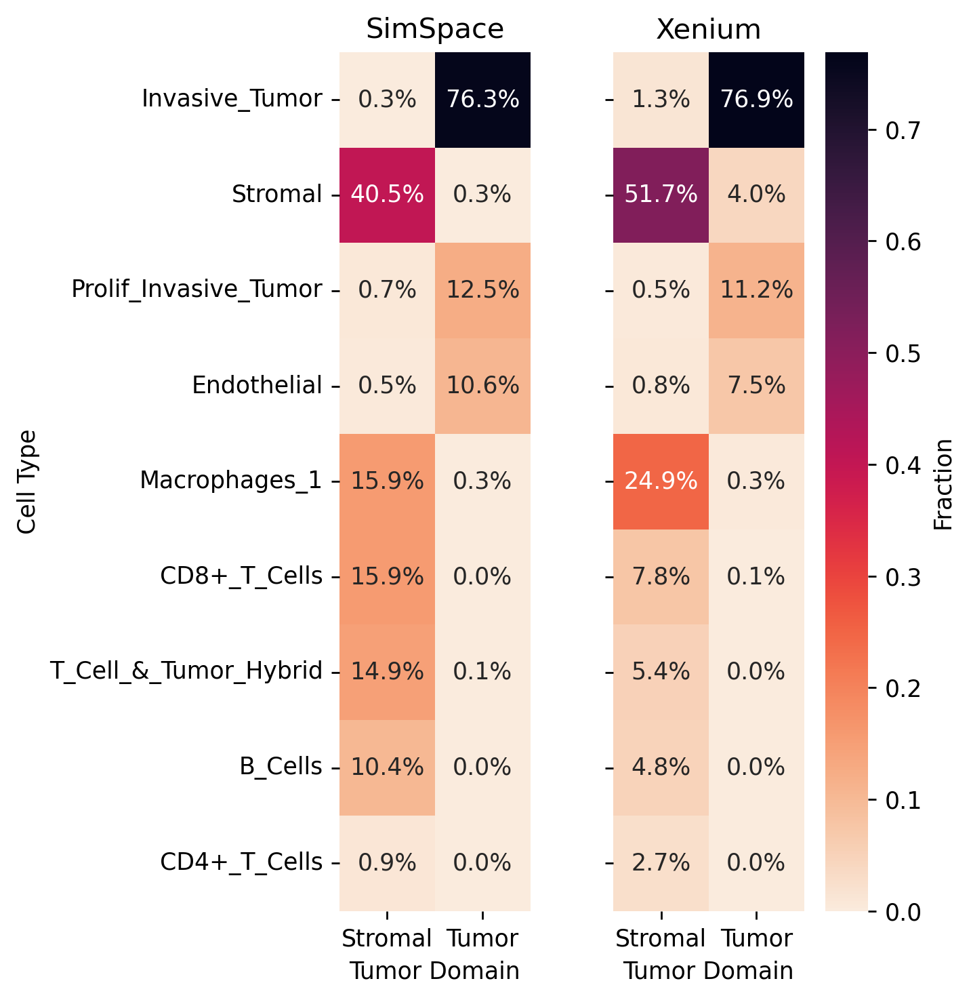

In [90]:
# Plot side-by-side heatmaps
fig, axes = plt.subplots(1, 2, figsize=(6, 6), dpi=250)
sns.heatmap(comp_ss.T, ax=axes[0], cmap='rocket_r', vmin=0, vmax=vmax,
            annot=annot_ss.T, fmt='', cbar=False, cbar_kws={'label': 'Fraction'})
axes[0].set_title('SimSpace')
axes[0].set_xlabel('Tumor Domain')
axes[0].set_ylabel('Cell Type')
axes[0].set_aspect('equal')

sns.heatmap(comp_xen.T, ax=axes[1], cmap='rocket_r', vmin=0, vmax=vmax,
            annot=annot_xen.T, fmt='', cbar=True, cbar_kws={'label': 'Fraction'})
axes[1].set_title('Xenium')
axes[1].set_xlabel('Tumor Domain')
axes[1].set_ylabel(None)
axes[1].set_yticklabels([])
axes[1].set_aspect('equal')

plt.tight_layout()
plt.show()

In [7]:
# compute Pearson correlation between Tumor and Stromal composition vectors
# use ct_order to align columns (already present in the notebook)

ss_vec_stromal = comp_ss.loc['Stromal', ct_order].astype(float)
ss_vec_tumor   = comp_ss.loc['Tumor',   ct_order].astype(float)

xen_vec_stromal = comp_xen.loc['Stromal', ct_order].astype(float)
xen_vec_tumor   = comp_xen.loc['Tumor',   ct_order].astype(float)

r_tumor, p_tumor = stats.pearsonr(ss_vec_tumor, xen_vec_tumor)
r_stromal, p_stromal = stats.pearsonr(ss_vec_stromal, xen_vec_stromal)

print(f"Tumor:   Pearson r = {r_tumor:.4f}, p-value = {p_tumor:.4e}")
print(f"Stromal: Pearson r = {r_stromal:.4f}, p-value = {p_stromal:.4e}")

Tumor:   Pearson r = 0.9974, p-value = 2.9197e-09
Stromal: Pearson r = 0.9219, p-value = 4.0547e-04


## ARI & NMI

In [32]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

y_niche, y_spatial = bank_domain['niche'], bank_domain['domain_cluster']

# 2) Metrics
ari = adjusted_rand_score(y_niche, y_spatial)
nmi = normalized_mutual_info_score(y_niche, y_spatial, average_method='arithmetic')

print(f"ARI = {ari:.3f}, NMI = {nmi:.3f}")

ARI = 0.507, NMI = 0.475


In [33]:
rng = np.random.default_rng(42)
B = 1000
N = len(y_niche)
aris, nmis = [], []

for _ in range(B):
    idx = rng.integers(0, N, N)  # sample cells with replacement
    aris.append(adjusted_rand_score(y_niche[idx], y_spatial[idx]))
    nmis.append(normalized_mutual_info_score(y_niche[idx], y_spatial[idx], average_method='arithmetic'))

def ci(x):
    lo, hi = np.percentile(x, [2.5, 97.5])
    return lo, hi

ari_ci = ci(aris)
nmi_ci = ci(nmis)
print(f"ARI 95% CI: [{ari_ci[0]:.3f}, {ari_ci[1]:.3f}]")
print(f"NMI 95% CI: [{nmi_ci[0]:.3f}, {nmi_ci[1]:.3f}]")

ARI 95% CI: [0.474, 0.544]
NMI 95% CI: [0.447, 0.508]


# Fig. 4A: Schematics for cell type deconvolution

In [2]:
shape = (100, 100)
# Generate a simulation space
sim1 = ss.util.sim_from_json(
    input_file='/Users/zhaotianxiao/Library/CloudStorage/Dropbox/FenyoLab/Project/Spatialsim/output/best_solution_breast_23_0331.json',
    shape=shape,
    num_iteration=4,
    n_iter=6,
)
sim1.update_seed(seed=1)

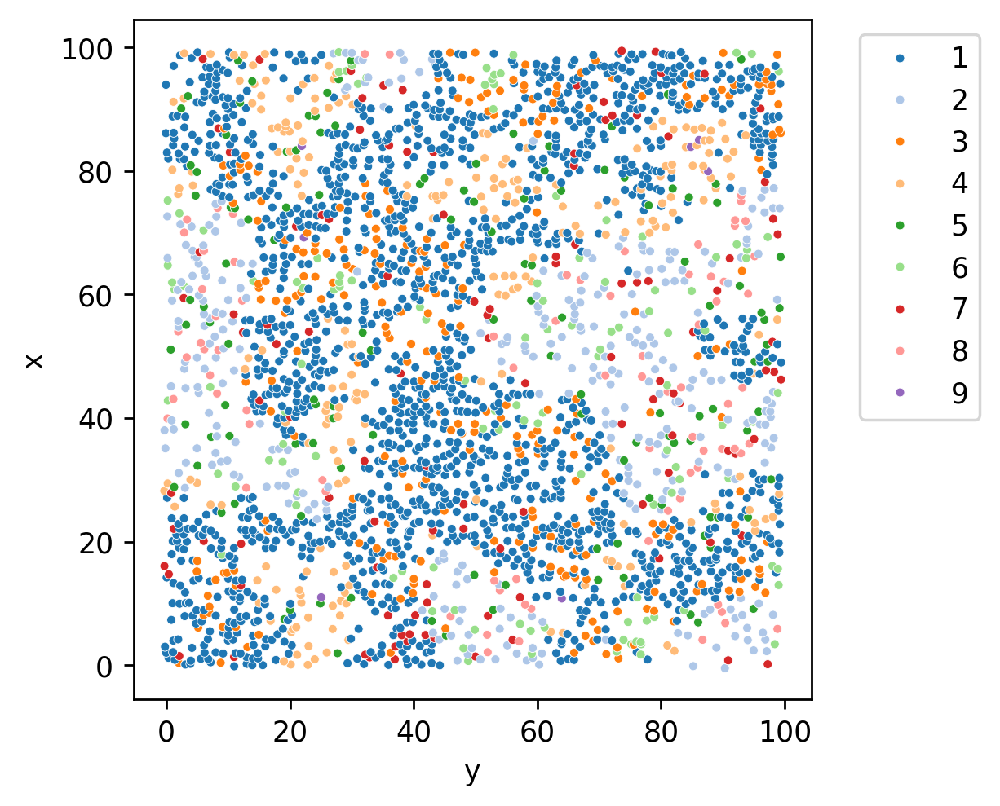

In [3]:
simulation = sim1.meta.copy()
simulation.columns = ['celltype', 'x', 'y', 'spatial_domain', 'celltype_rank']
tmp = simulation[simulation['celltype'] == -1].index
simulation = simulation.drop(tmp)
simulation = simulation.reset_index(drop=True)
simulation['celltype'] = simulation['celltype'].astype(int)
cell_counts = simulation['celltype'].value_counts()

plt.figure(figsize=(5, 5), dpi = 250)
sns.scatterplot(x='y', y='x', data=simulation, hue='celltype_rank', palette='tab20', legend=True, s=10)
plt.gca().set_aspect('equal')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

In [4]:
sim1.update_seed(seed=1)
sim1.create_omics(n_genes=1000, bg_ratio=0.2)
cmap = sns.color_palette('tab20', n_colors=sim1.num_states)

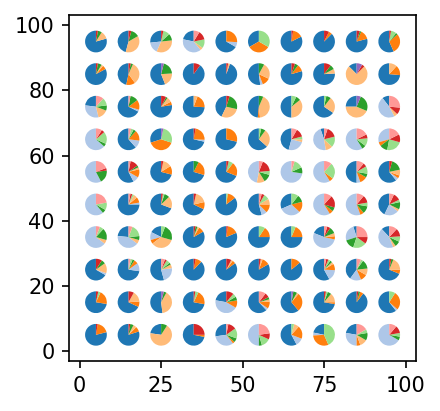

In [6]:
kernel = (10, 10)
spot_meta, spot_omics = ss.util.convolve(sim1, kernel=kernel, scale=2)
# print(state_colors[0])
fig, ax = plt.subplots()
fig.set_size_inches(4, 3)
fig.set_dpi(150)
ax.set_aspect('equal')
for i in range(len(spot_meta)):
    centroid_x = spot_meta.iloc[i]['col']
    centroid_y = spot_meta.iloc[i]['row']
    state_proportions = spot_meta.iloc[i][2:]
    state_proportions = state_proportions[state_proportions > 0]
    state_proportions = state_proportions / state_proportions.sum()
    wedges, texts = ax.pie(state_proportions, 
                            colors=[cmap[state-1] for state in state_proportions.index], 
                            startangle=90, 
                            radius=kernel[0]/3, 
                            center=(centroid_x, centroid_y), 
                            frame=True,
                            )

# Fig. 5A: SVG Schematics

### SimSpace

In [7]:
shape = (100, 100)
# Generate a simulation space
sim1 = ss.util.sim_from_json(
    input_file='/Users/zhaotianxiao/Library/CloudStorage/Dropbox/FenyoLab/Project/Spatialsim/output/best_solution_breast_23_0331.json',
    shape=shape,
    num_iteration=4,
    n_iter=6,
)
sim1.update_seed(seed=0)

In [8]:
sim1.fit_scdesign(
    '../data/reference_count.csv',
    '../data/reference_metadata.csv',
    'Cluster',
    'x_centroid',
    'y_centroid',
    seed=0,
)

Temporary directory created.
scDesgin fit complete.


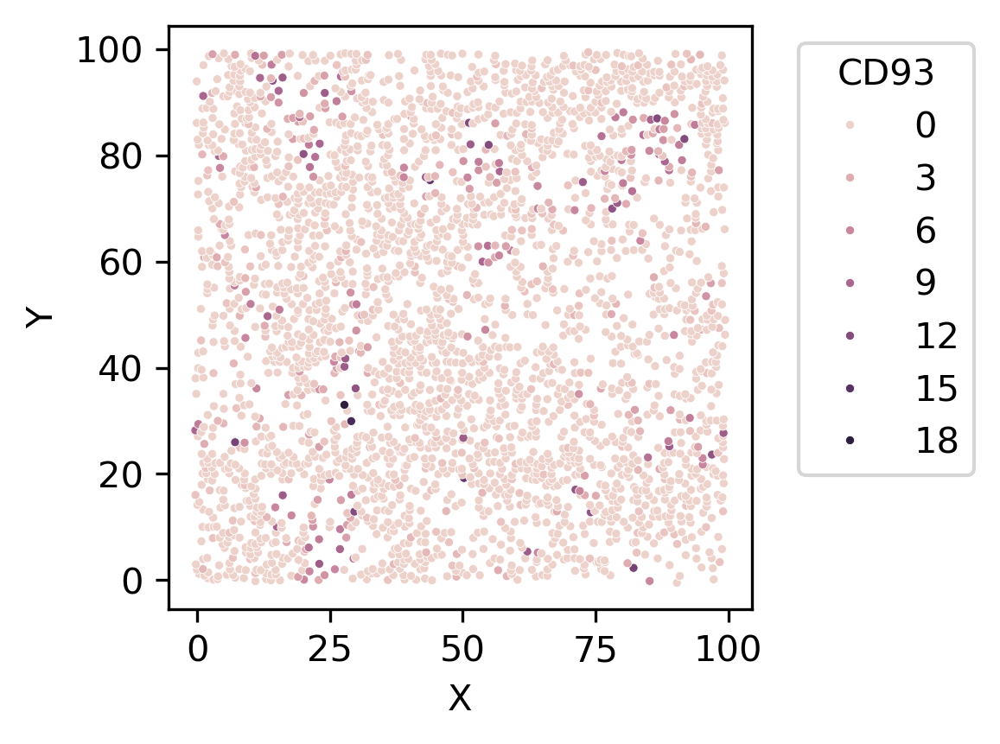

In [9]:
sim1.plot('CD93', figsize=(4, 6), dpi=300, size = 6)

### Xenium

In [25]:
cells = pd.read_csv("../data/reference_metadata.csv")
genes = pd.read_csv('../data/reference_count.csv', index_col=0)
genes = genes.T
cell_counts = cells['Cluster'].value_counts()
cells = cells[cells['Cluster'].isin(cell_counts[cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(cells['Cluster'].value_counts().index, 1)}
cells['celltype_rank'] = cells['Cluster'].map(ranked_cell_types)

cells['x_centroid'] = 100 * (cells['x_centroid'] - cells['x_centroid'].min()) / (cells['x_centroid'].max() - cells['x_centroid'].min())
cells['y_centroid'] = 100 * (cells['y_centroid'] - cells['y_centroid'].min()) / (cells['y_centroid'].max() - cells['y_centroid'].min())

In [26]:
genes.index = cells.index
merged_df = pd.concat([cells.reset_index(drop=True), genes.reset_index(drop=True)], axis=1)

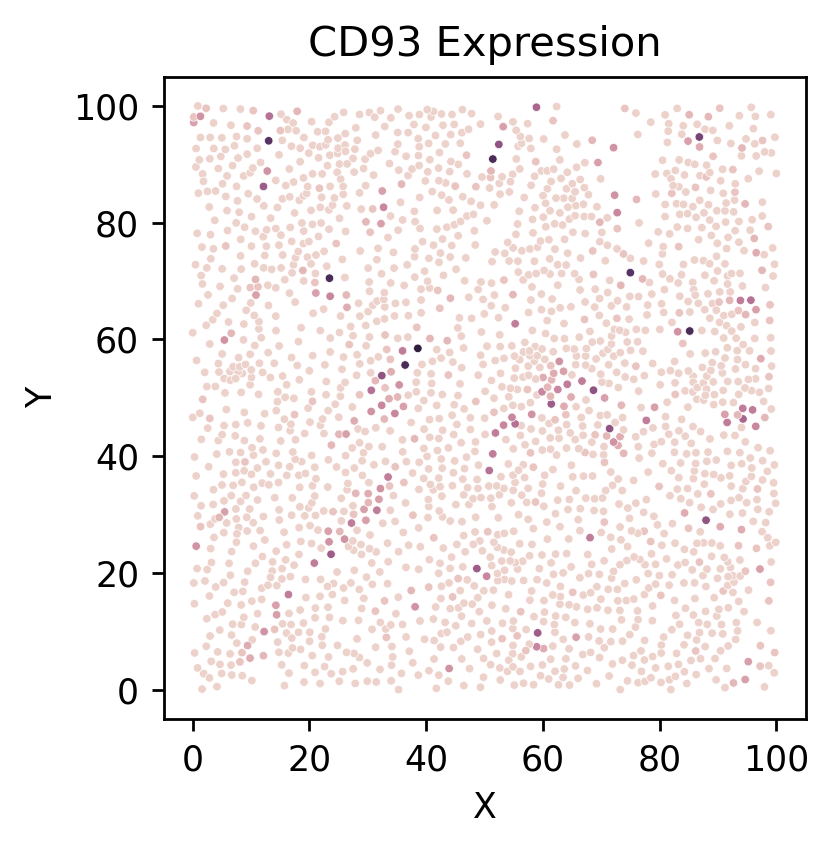

In [28]:
plt.figure(figsize=(5, 3.5), dpi = 250)
sns.scatterplot(x='x_centroid', y='y_centroid', data=merged_df, hue='CD93', legend=True, s=6)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('CD93 Expression')
plt.tight_layout()
plt.show()

### Multiple reference-free examples

In [30]:
# 280, 281, 381, reference-based 
param = ss.util.generate_random_parameters(n_group=2, n_state=8, seed=0)
sim = ss.util.sim_from_params(
    param,
    shape=(100, 100),
    num_iteration=4,
    n_iter=6,
    custom_neighbor=ss.spatial.generate_offsets(3, 'manhattan'),
    seed=0
)

sim.fit_scdesign(
    '../data/reference_count.csv',
    '../data/reference_metadata.csv',
    'Cluster',
    'x_centroid',
    'y_centroid',
    seed=0,
)

Temporary directory created.
scDesgin fit complete.


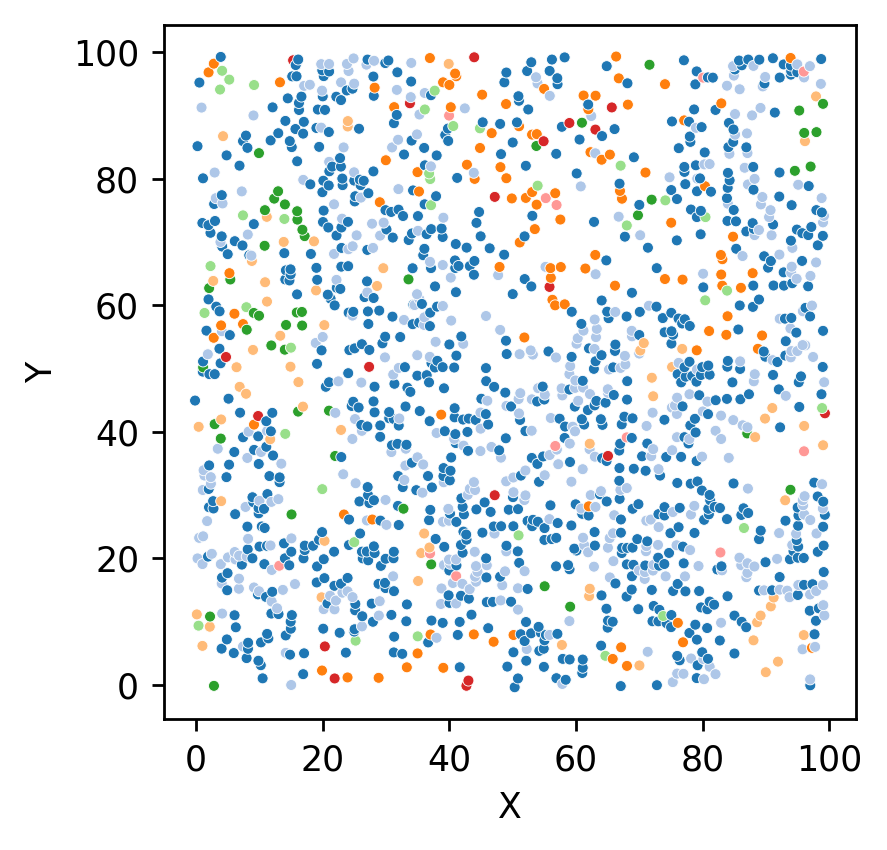

In [31]:
simulation = sim.meta.copy()
plt.figure(figsize=(5, 3.5), dpi = 250)
sns.scatterplot(x='row', y='col', data=simulation, hue='state_rank', palette='tab20', legend=True, s=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
# plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

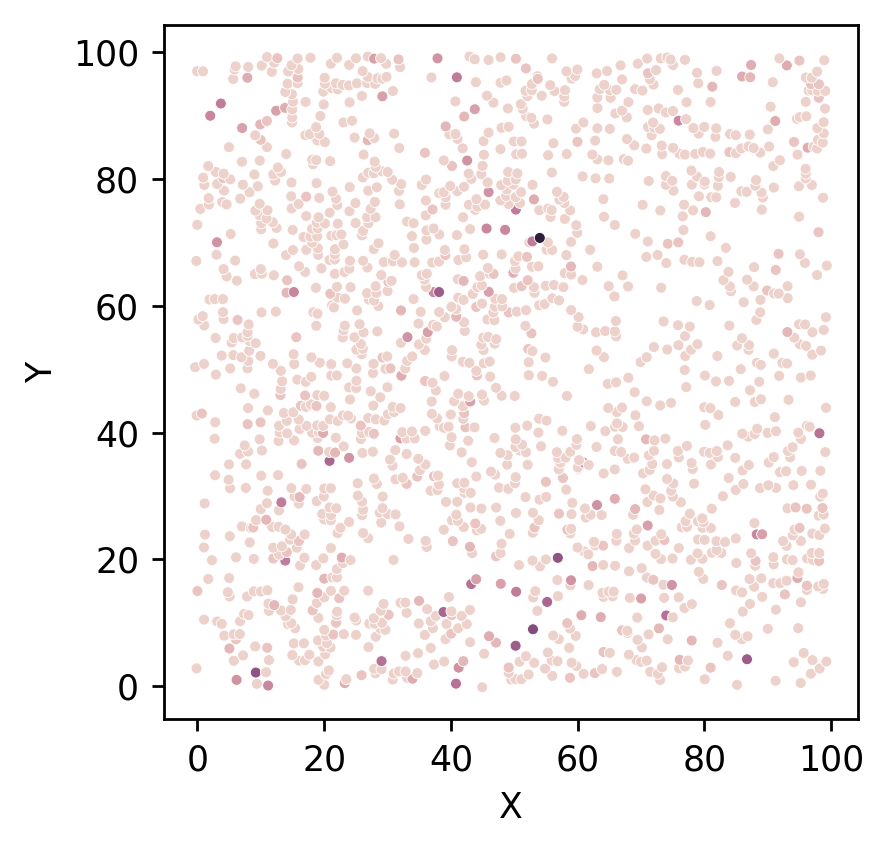

In [32]:
sim.plot('CD93', figsize=(5, 3.5), dpi = 250, size=10, legend=False)

# Fig. 5C: SVG Comparison

In [33]:
BSP_dir = "../fig_data/SVG/scBSP"
hotspot_dir = "../fig_data/SVG/hotspot"
giotto_rank_dir = "../fig_data/SVG/giotto_rank"
giotto_kmeans_dir = "../fig_data/SVG/giotto_kmeans"
MI_dir = "../fig_data/SVG/moransi"
SpatialDE_dir = "../fig_data/SVG/spatialde"
spark_dir = "../fig_data/SVG/spark"

In [34]:
BSP_fitted = pd.read_csv(f"{BSP_dir}/svg_scBSP_fitted.csv")
Hotspot_fitted = pd.read_csv(f"{hotspot_dir}/svg_hotspot_fitted.csv")
Giotto_fitted_1 = pd.read_csv(f"{giotto_kmeans_dir}/svg_giotto_kmeans_xenium.csv")
Giotto_fitted_2 = pd.read_csv(f"{giotto_rank_dir}/svg_giotto_rank_xenium.csv")
MI_fitted = pd.read_csv(f"{MI_dir}/svg_moransi_xenium.csv")
SpatialDE_fitted = pd.read_csv(f"{SpatialDE_dir}/svg_spatialde_xenium.csv")
Spark_fitted = pd.read_csv(f"{spark_dir}/svg_spark_fitted.csv", index_col=0)

BSP_ref = pd.read_csv(f"{BSP_dir}/svg_scBSP_reference.csv")
Hotspot_ref = pd.read_csv(f"{hotspot_dir}/svg_hotspot_reference.csv")
Giotto_ref_1 = pd.read_csv(f"{giotto_kmeans_dir}/svg_giotto_kmeans_ref.csv")
Giotto_ref_2 = pd.read_csv(f"{giotto_rank_dir}/svg_giotto_rank_ref.csv")
MI_ref = pd.read_csv(f"{MI_dir}/svg_moransi_ref.csv")
SpatialDE_ref = pd.read_csv(f"{SpatialDE_dir}/svg_spatialde_ref.csv")
Spark_ref = pd.read_csv(f"{spark_dir}/svg_spark_reference.csv", index_col=0)

In [35]:
Hotspot_fitted = Hotspot_fitted.sort_values(by='Gene')
Hotspot_fitted.reset_index(drop=True, inplace=True)
# min_nonzero_fdr = Hotspot_fitted.loc[Hotspot_fitted['FDR'] > 0, 'FDR'].min()
# Hotspot_fitted.loc[Hotspot_fitted['FDR'] == 0, 'FDR'] = min_nonzero_fdr

Hotspot_ref = Hotspot_ref.sort_values(by='Gene')
Hotspot_ref.reset_index(drop=True, inplace=True)
# min_nonzero_fdr = Hotspot_ref.loc[Hotspot_ref['FDR'] > 0, 'FDR'].min()
# Hotspot_ref.loc[Hotspot_ref['FDR'] == 0, 'FDR'] = min_nonzero_fdr   

Giotto_fitted_1 = Giotto_fitted_1.sort_values(by='genes')
Giotto_fitted_1.reset_index(drop=True, inplace=True)

Giotto_ref_1 = Giotto_ref_1.sort_values(by='genes')
Giotto_ref_1.reset_index(drop=True, inplace=True)

Giotto_fitted_2 = Giotto_fitted_2.sort_values(by='genes')
Giotto_fitted_2.reset_index(drop=True, inplace=True)

Giotto_ref_2 = Giotto_ref_2.sort_values(by='genes')
Giotto_ref_2.reset_index(drop=True, inplace=True)

MI_fitted = MI_fitted.sort_values(by='genes')
MI_fitted.reset_index(drop=True, inplace=True)
MI_ref = MI_ref.sort_values(by='genes')
MI_ref.reset_index(drop=True, inplace=True)
    
# min_nonzero_fdr = SpatialDE_fitted.loc[SpatialDE_fitted['qval'] > 0, 'qval'].min()
# SpatialDE_fitted.loc[SpatialDE_fitted['qval'] == 0, 'qval'] = min_nonzero_fdr
# min_nonzero_fdr = SpatialDE_fitted.loc[SpatialDE_fitted['qval'] > 0, 'qval'].min()
# SpatialDE_fitted.loc[SpatialDE_fitted['qval'] == 0, 'qval'] = min_nonzero_fdr

Spark_fitted.index = Hotspot_fitted.index
Spark_ref.index = Hotspot_ref.index

In [36]:
combined = pd.DataFrame({
    'Gene': Hotspot_fitted['Gene'],
    'Hotspot_fitted': Hotspot_fitted['FDR'],
    'Hotspot_reference': Hotspot_ref['FDR'],
    'BSP_fitted': BSP_fitted['P_values'],
    'BSP_reference': BSP_ref['P_values'],
    'Giotto_kmeans_fitted': Giotto_fitted_1['adj.p.value'],
    'Giotto_kmeans_reference': Giotto_ref_1['adj.p.value'],
    'Giotto_rank_fitted': Giotto_fitted_2['adj.p.value'],
    'Giotto_rank_reference': Giotto_ref_2['adj.p.value'],
    'MI_fitted': MI_fitted['p.value'],
    'MI_reference': MI_ref['p.value'],
    'SpatialDE_fitted': SpatialDE_fitted['qval'],
    'SpatialDE_reference': SpatialDE_ref['qval'],
    'Spark_fitted': Spark_fitted['adjusted_pvalue'],
    'Spark_reference': Spark_ref['adjusted_pvalue']
})

In [37]:
# Convert p-values to ranks for each column in combined (smaller p-value = higher rank)
combined_ranks = combined.copy()
for col in combined.columns[1:]:  # skip 'Gene'
    combined_ranks[col] = combined[col].rank(method='min', ascending=True)

### Scatterplot: ranks

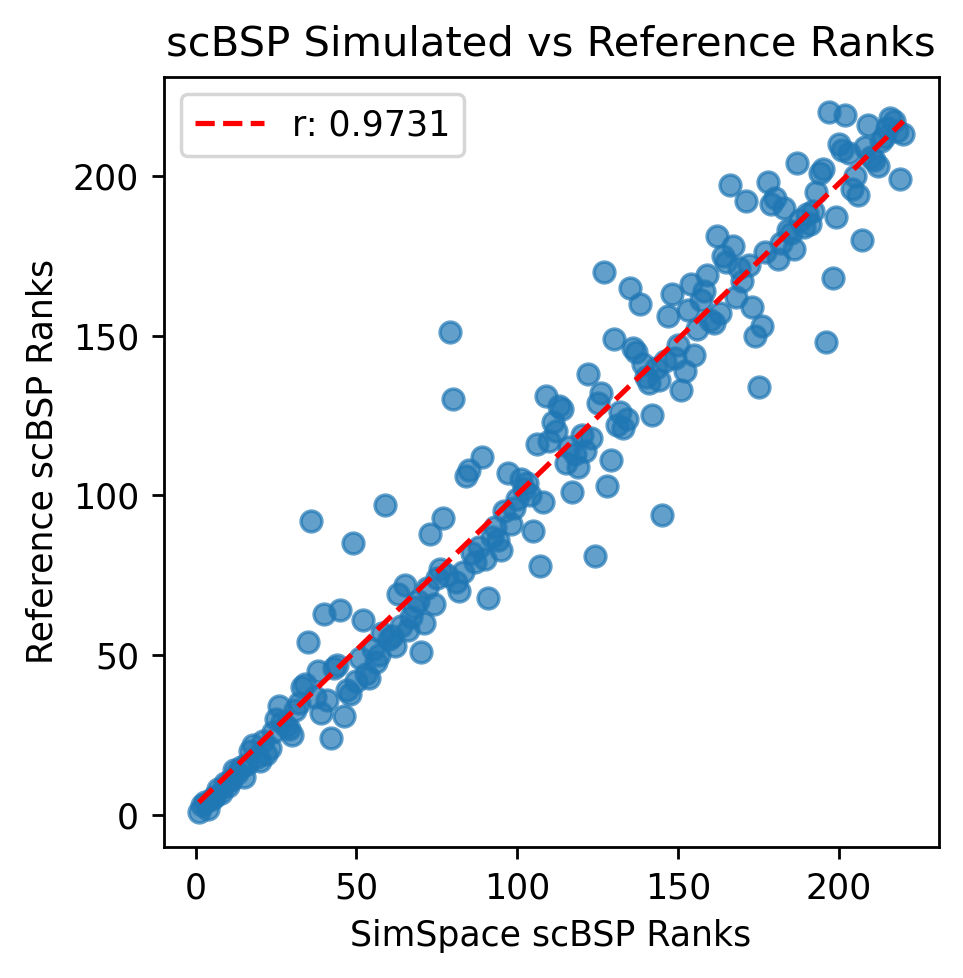

R-squared: 0.9468
P-value: 6.6853e-141


In [38]:
from scipy.stats import linregress

slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['BSP_fitted']), (combined_ranks['BSP_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['BSP_fitted'], combined_ranks['BSP_reference'], alpha=0.7)
plt.plot([combined_ranks['BSP_fitted'].min(), combined_ranks['BSP_fitted'].max()], 
         [slope * combined_ranks['BSP_reference'].min() + intercept, slope * combined_ranks['BSP_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace scBSP Ranks')
plt.ylabel('Reference scBSP Ranks')
plt.title('scBSP Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()


print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

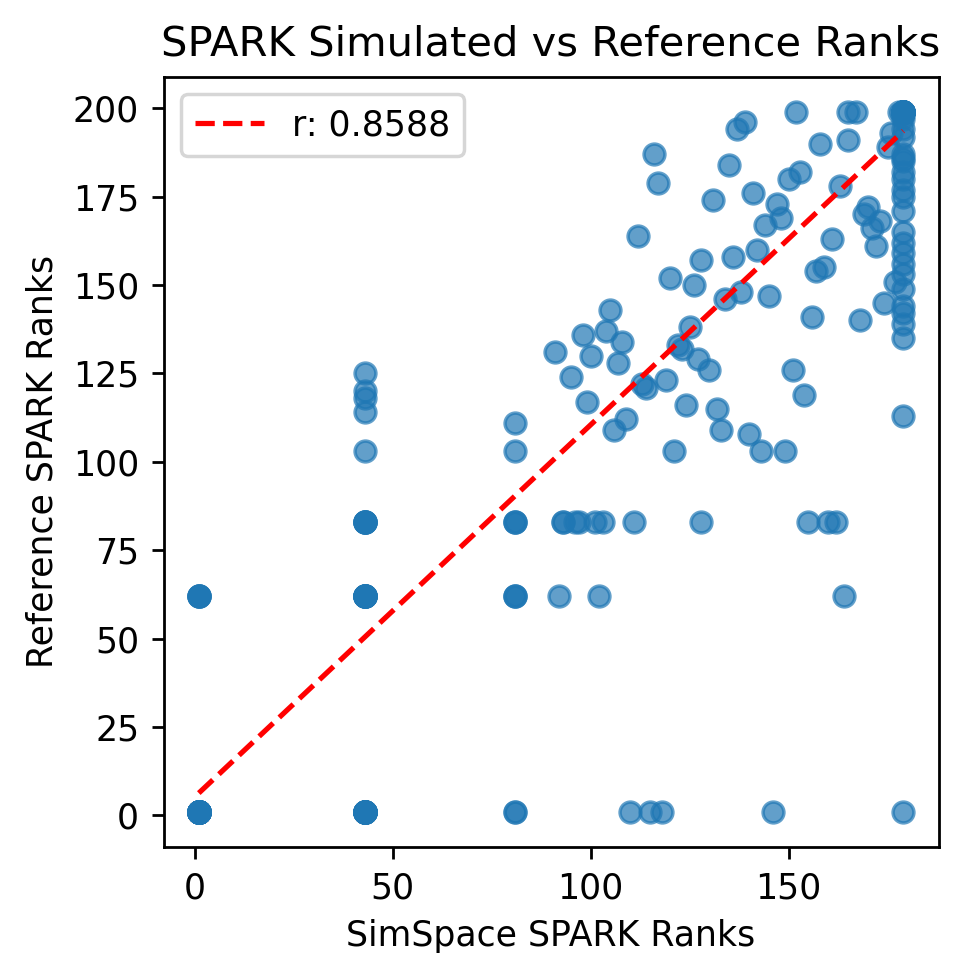

R-squared: 0.8588
P-value: 3.0494e-65


In [39]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['Spark_fitted']), (combined_ranks['Spark_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['Spark_fitted'], combined_ranks['Spark_reference'], alpha=0.7)
plt.plot([combined_ranks['Spark_fitted'].min(), combined_ranks['Spark_fitted'].max()], 
         [slope * combined_ranks['Spark_reference'].min() + intercept, slope * combined_ranks['Spark_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace SPARK Ranks')
plt.ylabel('Reference SPARK Ranks')
plt.title('SPARK Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()


print(f"R-squared: {r_value:.4f}")
print(f"P-value: {p_value:.4e}")

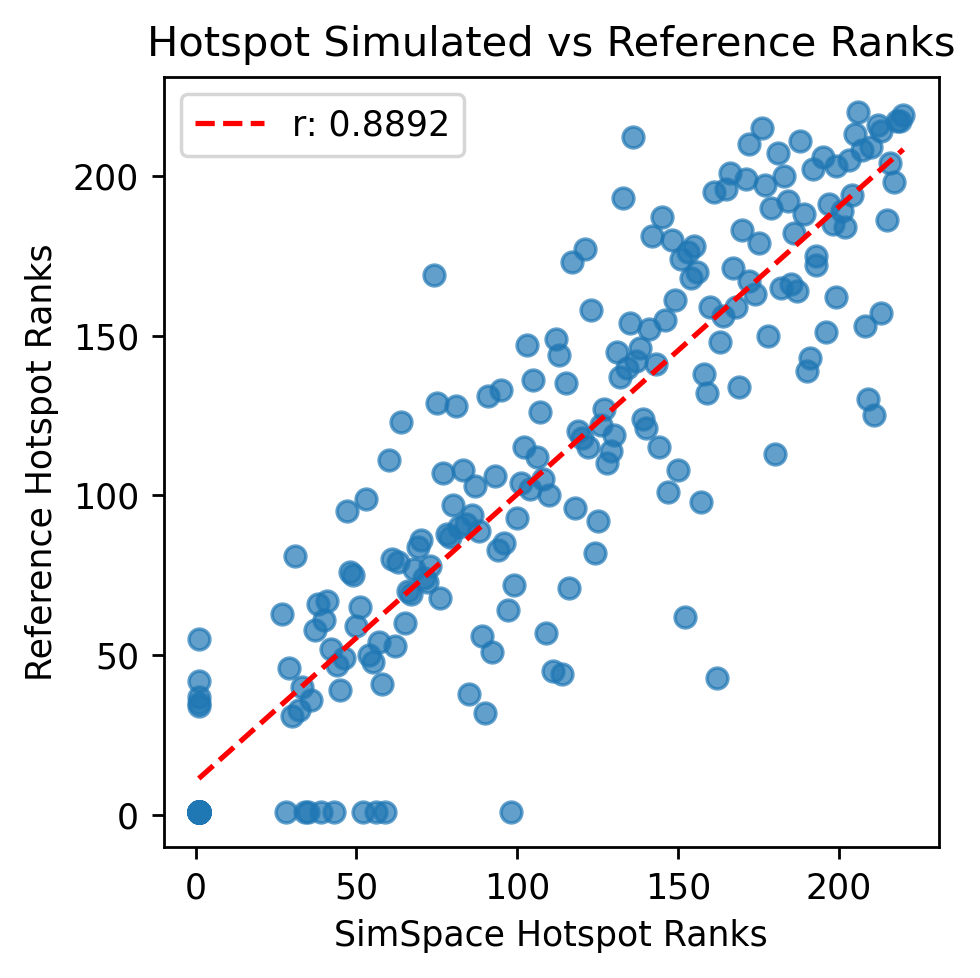

R-squared: 0.7906
P-value: 5.7608e-76


In [40]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['Hotspot_fitted']), (combined_ranks['Hotspot_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['Hotspot_fitted'], combined_ranks['Hotspot_reference'], alpha=0.7)
plt.plot([combined_ranks['Hotspot_fitted'].min(), combined_ranks['Hotspot_fitted'].max()], 
         [slope * combined_ranks['Hotspot_reference'].min() + intercept, slope * combined_ranks['Hotspot_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace Hotspot Ranks')
plt.ylabel('Reference Hotspot Ranks')
plt.title('Hotspot Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()

print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

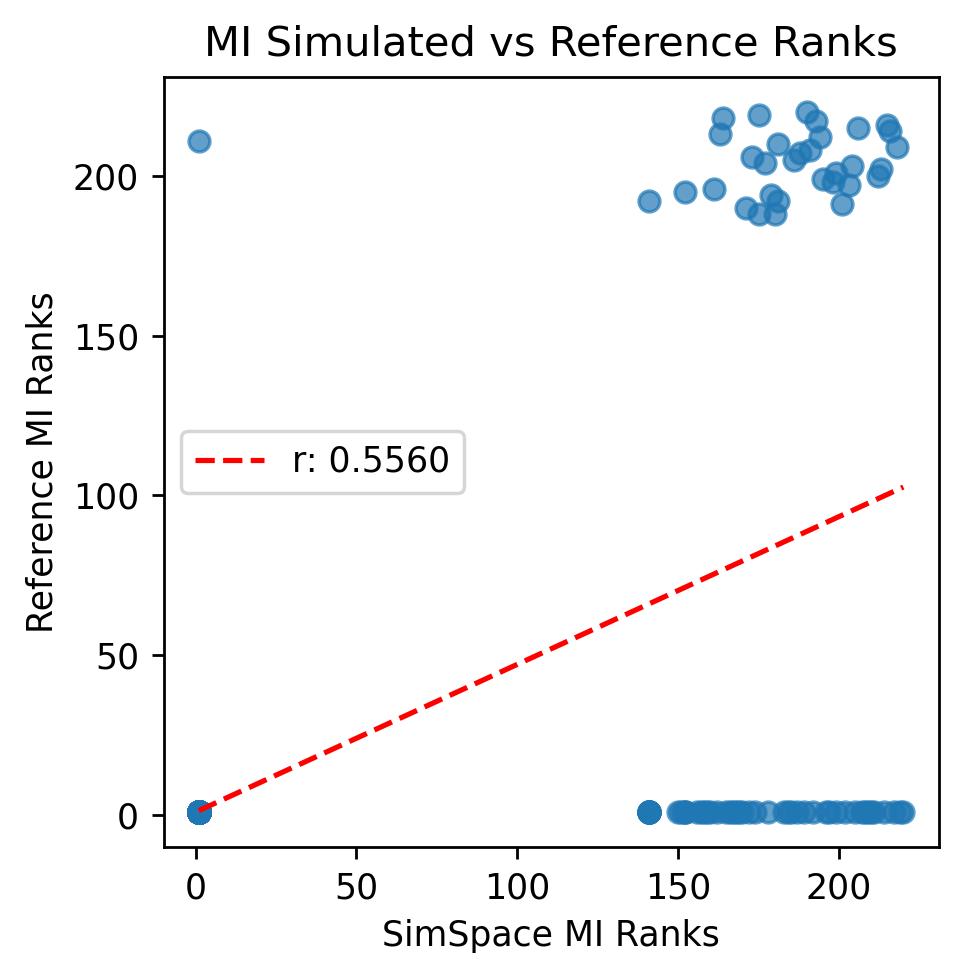

R-squared: 0.3092
P-value: 2.9845e-19


In [41]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['MI_fitted']), (combined_ranks['MI_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['MI_fitted'], combined_ranks['MI_reference'], alpha=0.7)
plt.plot([combined_ranks['MI_fitted'].min(), combined_ranks['MI_fitted'].max()], 
         [slope * combined_ranks['MI_reference'].min() + intercept, slope * combined_ranks['MI_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace MI Ranks')
plt.ylabel('Reference MI Ranks')
plt.title('MI Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()

print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

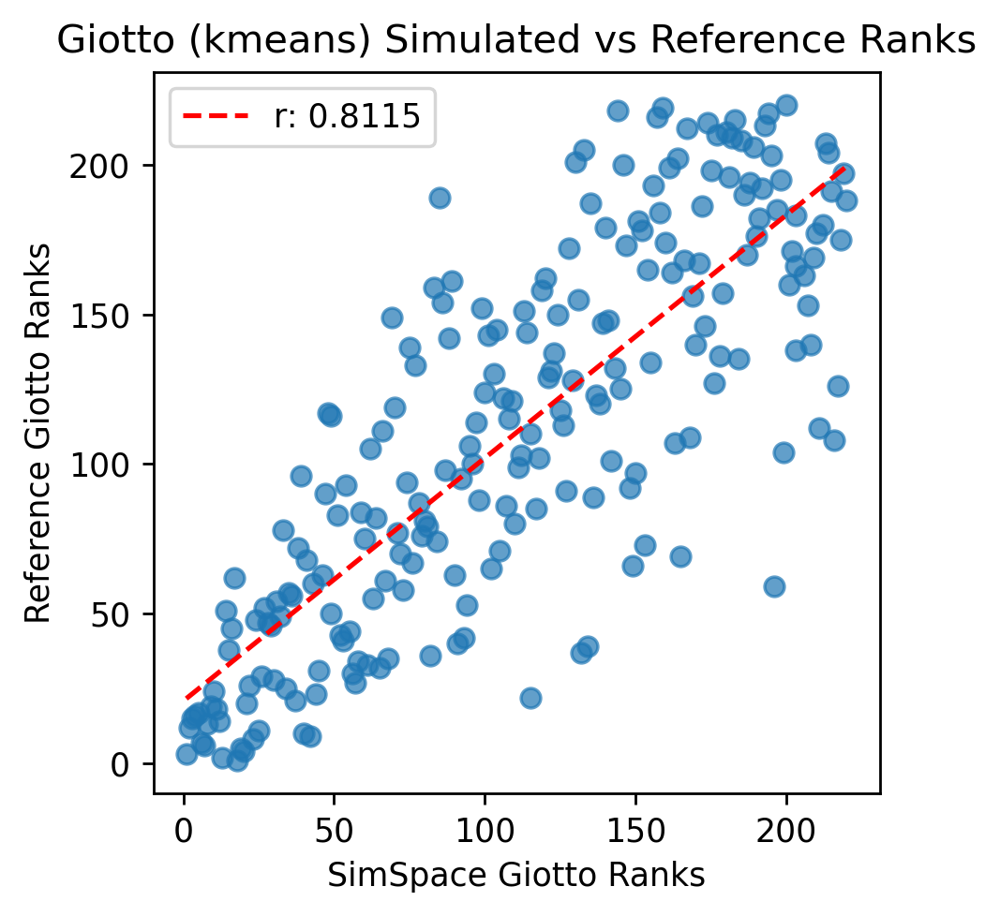

R-squared: 0.6585
P-value: 9.2216e-53


In [42]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['Giotto_kmeans_fitted']), (combined_ranks['Giotto_kmeans_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['Giotto_kmeans_fitted'], combined_ranks['Giotto_kmeans_reference'], alpha=0.7)
plt.plot([combined_ranks['Giotto_kmeans_fitted'].min(), combined_ranks['Giotto_kmeans_fitted'].max()], 
         [slope * combined_ranks['Giotto_kmeans_reference'].min() + intercept, slope * combined_ranks['Giotto_kmeans_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace Giotto Ranks')
plt.ylabel('Reference Giotto Ranks')
plt.title('Giotto (kmeans) Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()

print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

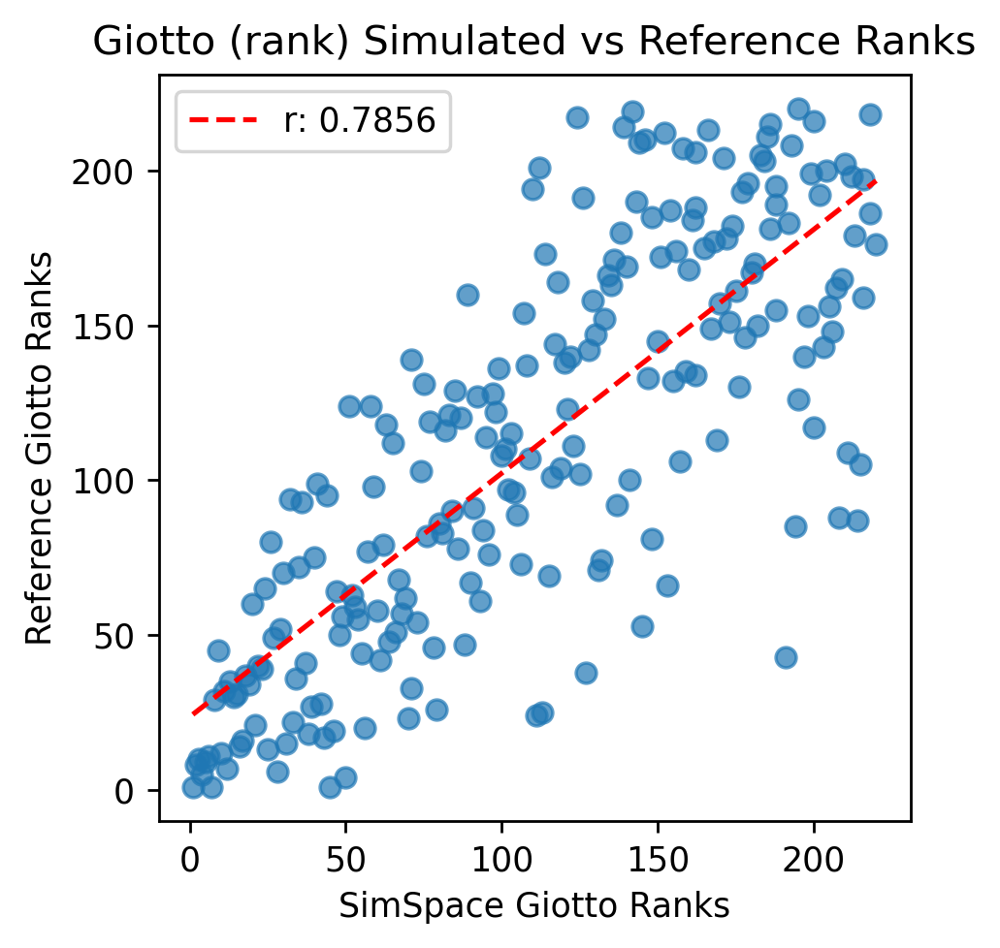

R-squared: 0.6172
P-value: 2.3702e-47


In [43]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['Giotto_rank_fitted']), (combined_ranks['Giotto_rank_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['Giotto_rank_fitted'], combined_ranks['Giotto_rank_reference'], alpha=0.7)
plt.plot([combined_ranks['Giotto_rank_fitted'].min(), combined_ranks['Giotto_rank_fitted'].max()], 
         [slope * combined_ranks['Giotto_rank_reference'].min() + intercept, slope * combined_ranks['Giotto_rank_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace Giotto Ranks')
plt.ylabel('Reference Giotto Ranks')
plt.title('Giotto (rank) Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()

print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

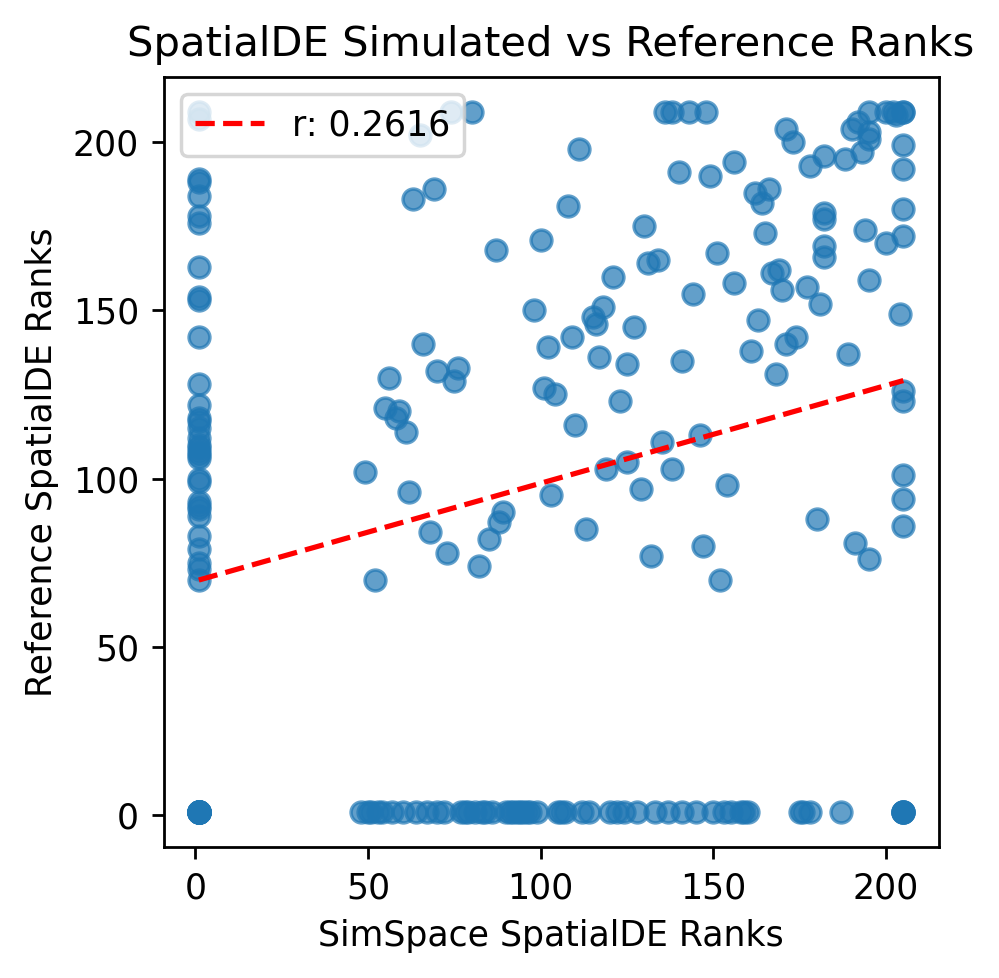

R-squared: 0.0684
P-value: 8.6101e-05


In [44]:
slope, intercept, r_value, p_value, std_err = linregress((combined_ranks['SpatialDE_fitted']), (combined_ranks['SpatialDE_reference']))

plt.figure(figsize=(4, 4), dpi=250)
plt.scatter(combined_ranks['SpatialDE_fitted'], combined_ranks['SpatialDE_reference'], alpha=0.7)
plt.plot([combined_ranks['SpatialDE_fitted'].min(), combined_ranks['SpatialDE_fitted'].max()], 
         [slope * combined_ranks['SpatialDE_reference'].min() + intercept, slope * combined_ranks['SpatialDE_reference'].max() + intercept],
         color='red', linestyle='--', label=f"r: {r_value:.4f}")
plt.legend()
plt.xlabel('SimSpace SpatialDE Ranks')
plt.ylabel('Reference SpatialDE Ranks')
plt.title('SpatialDE Simulated vs Reference Ranks')
# plt.gca().set_aspect('equal', adjustable='box')
plt.show()

print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4e}")

### Rank correlation and raw value F1 score

In [45]:
# Compute R^2 for each method
r_results = {}

# BSP
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['BSP_fitted'], combined_ranks['BSP_reference']
)
r_results['scBSP'] = r_value

# Hotspot (nonzero only)
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['Hotspot_fitted'], combined_ranks['Hotspot_reference']
)
r_results['Hotspot'] = r_value

# Giotto kmeans
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['Giotto_kmeans_fitted'],
    combined_ranks['Giotto_kmeans_reference']
)
r_results['Giotto(kmeans)'] = r_value

# Giotto kmeans
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['Giotto_rank_fitted'],
    combined_ranks['Giotto_rank_reference']
)
r_results['Giotto(rank)'] = r_value

# MI
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['MI_fitted'],
    combined_ranks['MI_reference']
)
r_results['Moran\'s I'] = r_value

# SPARK
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['Spark_fitted'],
    combined_ranks['Spark_reference']
)
r_results['SPARK'] = r_value

# SpatialDE (nonzero only)
slope, intercept, r_value, p_value, std_err = linregress(
    combined_ranks['SpatialDE_fitted'],
    combined_ranks['SpatialDE_reference']
)
r_results['SpatialDE'] = r_value

# Summarize
r_summary = pd.Series(r_results, name='r')
print(r_summary)

scBSP             0.973061
Hotspot           0.889178
Giotto(kmeans)    0.811465
Giotto(rank)      0.785646
Moran's I         0.556023
SPARK             0.858773
SpatialDE         0.261607
Name: r, dtype: float64


In [46]:
from scipy.stats import fisher_exact

# Define threshold
threshold = 5e-2

# Prepare results dict
f1_ratios = {}

# Helper function to compute odds ratio
from sklearn.metrics import f1_score

def compute_f1(fitted, reference):
    # True = significant (< threshold), False = not significant
    fitted_sig = fitted < threshold
    reference_sig = reference < threshold
    # Compute F1 score (treat reference as ground truth)
    return f1_score(reference_sig, fitted_sig)

# BSP
f1_ratios['scBSP'] = compute_f1(combined['BSP_fitted'], combined['BSP_reference'])

# Hotspot
f1_ratios['Hotspot'] = compute_f1(combined['Hotspot_fitted'], combined['Hotspot_reference'])

# Giotto kmeans
f1_ratios['Giotto(kmeans)'] = compute_f1(combined['Giotto_kmeans_fitted'], combined['Giotto_kmeans_reference'])

# Giotto rank
f1_ratios['Giotto(rank)'] = compute_f1(combined['Giotto_rank_fitted'], combined['Giotto_rank_reference'])

# MI
f1_ratios['Moran\'s I'] = compute_f1(combined['MI_fitted'], combined['MI_reference'])

# SpatialDE
f1_ratios['SpatialDE'] = compute_f1(combined['SpatialDE_fitted'], combined['SpatialDE_reference'])

# SPARK
f1_ratios['SPARK'] = compute_f1(combined['Spark_fitted'], combined['Spark_reference'])

# Summarize
f1_summary = pd.Series(f1_ratios, name='F1_score')
print(f1_summary)


scBSP             0.933333
Hotspot           0.925532
Giotto(kmeans)    0.890080
Giotto(rank)      0.839650
Moran's I         0.888889
SpatialDE         0.782609
SPARK             0.896755
Name: F1_score, dtype: float64


In [47]:
from scipy import stats
# Prepare results dict
kendall_taus = {}

def compute_kendall_tau(fitted, reference):
    # Compute Kendall's tau (treat reference as ground truth)
    return stats.kendalltau(reference, fitted).correlation

# BSP
kendall_taus['scBSP'] = compute_kendall_tau(combined_ranks['BSP_fitted'], combined_ranks['BSP_reference'])
# Hotspot
kendall_taus['Hotspot'] = compute_kendall_tau(combined_ranks['Hotspot_fitted'], combined_ranks['Hotspot_reference'])
# Giotto kmeans
kendall_taus['Giotto(kmeans)'] = compute_kendall_tau(combined_ranks['Giotto_kmeans_fitted'], combined_ranks['Giotto_kmeans_reference'])
# Giotto rank
kendall_taus['Giotto(rank)'] = compute_kendall_tau(combined_ranks['Giotto_rank_fitted'], combined_ranks['Giotto_rank_reference'])
# MI
kendall_taus['Moran\'s I'] = compute_kendall_tau(combined_ranks['MI_fitted'], combined_ranks['MI_reference'])
# SpatialDE
kendall_taus['SpatialDE'] = compute_kendall_tau(combined_ranks['SpatialDE_fitted'], combined_ranks['SpatialDE_reference'])
# SPARK
kendall_taus['SPARK'] = compute_kendall_tau(combined_ranks['Spark_fitted'], combined_ranks['Spark_reference'])

# Summarize
kendall_tau_summary = pd.Series(kendall_taus, name='Kendall\'s Tau')
print(kendall_tau_summary)


scBSP             0.872146
Hotspot           0.717741
Giotto(kmeans)    0.612833
Giotto(rank)      0.587517
Moran's I         0.502696
SpatialDE         0.220575
SPARK             0.715660
Name: Kendall's Tau, dtype: float64


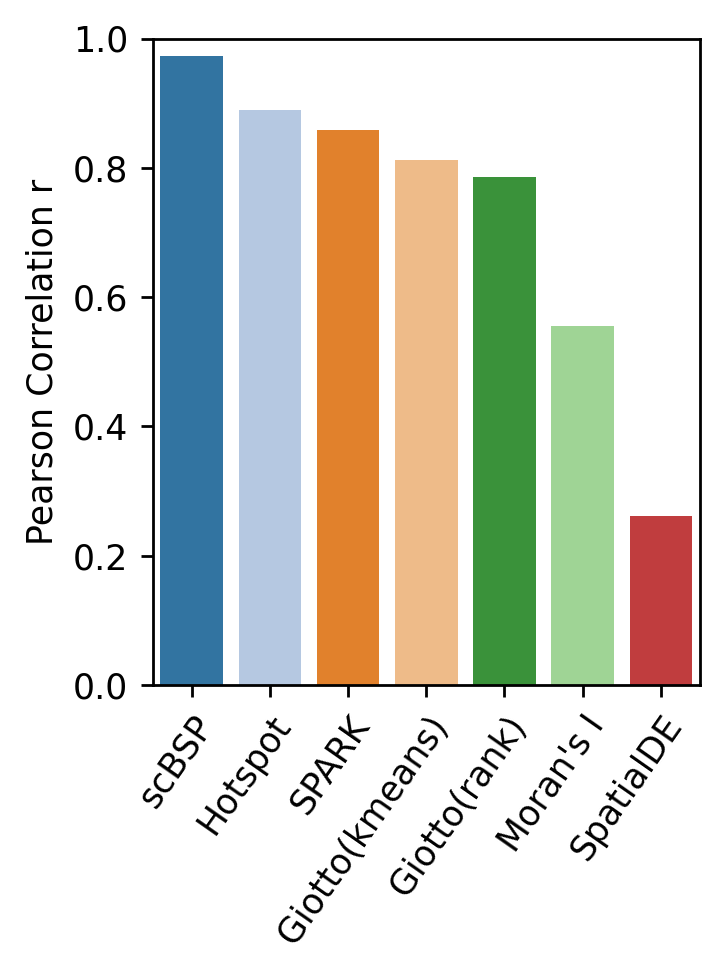

In [48]:
# Sort r_summary by value in descending order
plt.figure(figsize=(3, 4), dpi=250)
r_sorted = r_summary.sort_values(ascending=False)
sns.barplot(x=r_sorted.index, y=r_sorted.values, palette='tab20')
plt.ylabel('Pearson Correlation r')
# plt.title('Pearson r for Each Method')
plt.xticks(rotation=55, ha='right', rotation_mode='anchor')
plt.ylim(0, 1)
plt.xlabel(None)
plt.tight_layout()
plt.show()

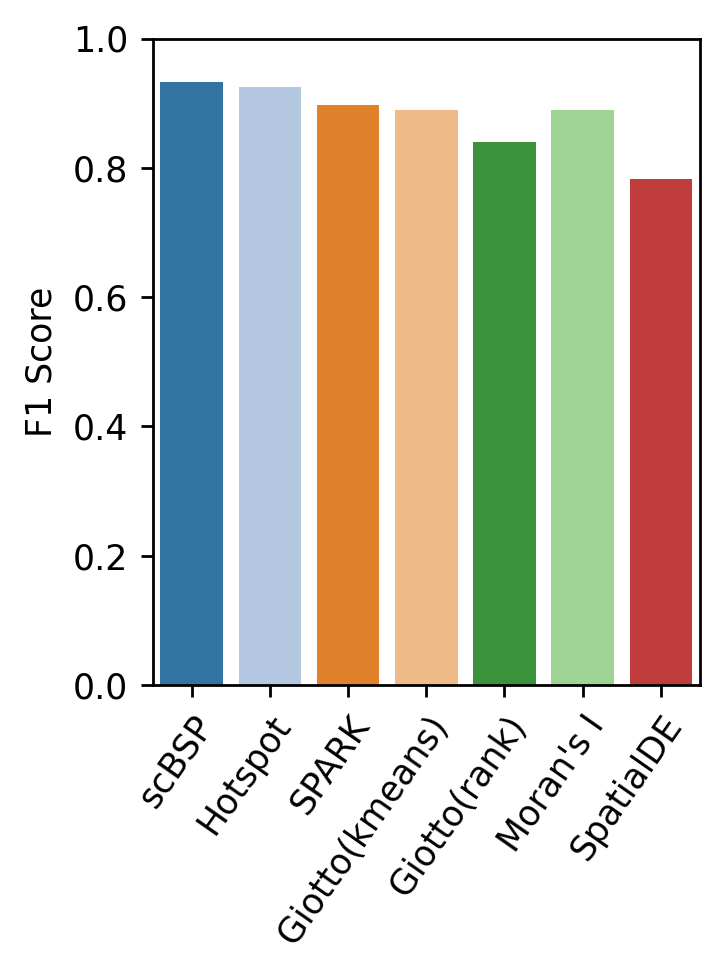

In [49]:
# Sort r_summary by value in descending order
plt.figure(figsize=(3, 4), dpi=250)
f1_sorted = f1_summary[r_sorted.index] # type: ignore
sns.barplot(x=f1_sorted.index, y=f1_sorted.values, palette='tab20')
plt.ylabel('F1 Score')
# plt.title('F1 Score of Spatial Methods')
plt.xticks(rotation=55, ha='right', rotation_mode='anchor')
plt.ylim(0, 1)
plt.xlabel(None)
plt.tight_layout()
plt.show()

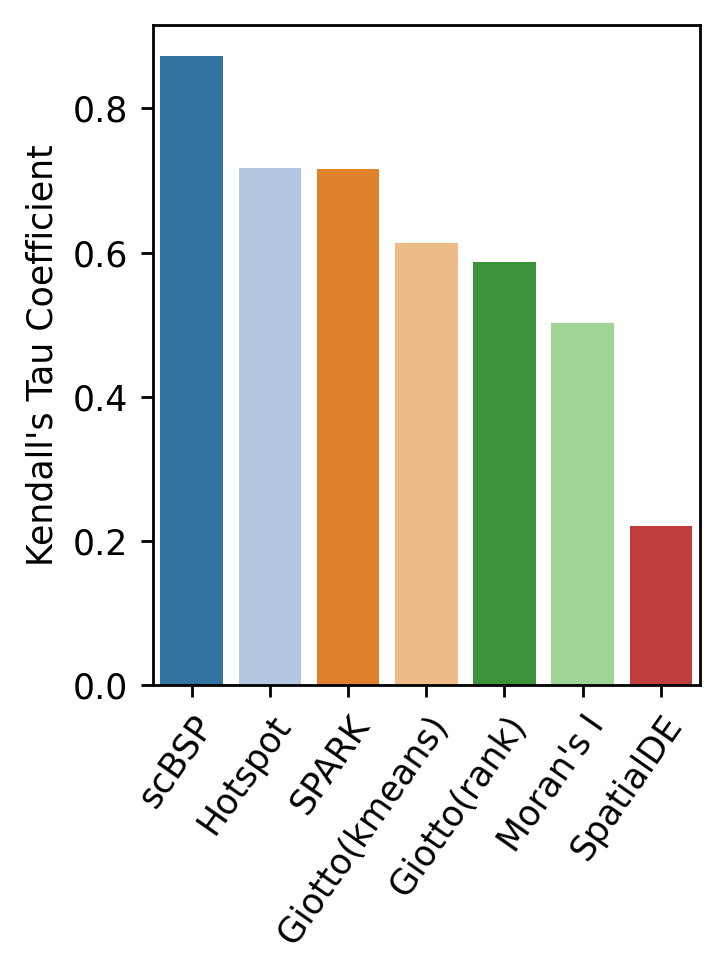

In [50]:
# Sort r_summary by value in descending order
plt.figure(figsize=(3, 4), dpi=250)
kendall_tau_sorted = kendall_tau_summary[r_sorted.index] # type: ignore
sns.barplot(x=kendall_tau_sorted.index, y=kendall_tau_sorted.values, palette='tab20')
plt.ylabel('Kendall\'s Tau Coefficient')
# plt.title('F1 Score of Spatial Methods')
plt.xticks(rotation=55, ha='right', rotation_mode='anchor')
plt.xlabel(None)
plt.tight_layout()
plt.show()

# Fig. 5D: SVG reproducibility

In [51]:
data_dir = "../fig_data/SVG/"

method_list = [
    'scBSP',
    'hotspot',
    'giotto_rank',
    'giotto_kmeans',
    'moransi',
    'spatialde',
    'spark'
]

replicate_index = [280, 281, 290, 291, 380, 381, 390, 391]

In [52]:
import numpy as np
from scipy.stats import chi2 as chi2_dist
from scipy.stats import spearmanr
import itertools

def kendalls_w(matrix):
    """
    matrix: rows are items (genes), columns are rankings (from replicates)
    """
    k = matrix.shape[1]  # number of rankings
    n = matrix.shape[0]  # number of items

    # Compute row means
    row_means = np.mean(matrix, axis=1)
    S = np.sum((np.sum(matrix, axis=1) - k * row_means.mean())**2)
    W = 12 * S / (k**2 * (n**3 - n))

    # Significance test (Kendall & Gibbons, 1990)
    # Under H0, the test statistic is: chi2 = k*(n-1)*W, df = n-1
    chi2 = k * (n - 1) * W
    p_value = 1 - chi2_dist.cdf(chi2, df=n-1)

    return W, chi2, p_value

from scipy.stats import spearmanr
import itertools

def avg_spearman(rank_matrix):
    pairs = list(itertools.combinations(range(rank_matrix.shape[1]), 2))
    corrs = [spearmanr(rank_matrix[:, i], rank_matrix[:, j])[0] for i, j in pairs]
    return np.mean(corrs)

### scBSP

In [53]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/scBSP/svg_scBSP_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = replicate_data['P_values']

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
scBSP_spearman = avg_spearman(all_replicates_ranked.values)
scBSP_kw = kendalls_w(all_replicates_ranked.values)

### giotto_kmeans

In [54]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/giotto_kmeans/svg_giotto_kmeans_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = -np.log(replicate_data['adj.p.value'])

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
giotto_kmeans_spearman = avg_spearman(all_replicates_ranked.values)
giotto_kmeans_kw = kendalls_w(all_replicates_ranked.values)

### giotto_rank

In [55]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/giotto_rank/svg_giotto_rank_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = -np.log(replicate_data['adj.p.value'])

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
giotto_rank_spearman = avg_spearman(all_replicates_ranked.values)
giotto_rank_kw = kendalls_w(all_replicates_ranked.values)

### hotspot

In [56]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/hotspot/svg_hotspot_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = -np.log(replicate_data['FDR'])

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
hotspot_spearman = avg_spearman(all_replicates_ranked.values)
hotspot_kw = kendalls_w(all_replicates_ranked.values)

### Moran's I

In [57]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/moransi/svg_moransi_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = replicate_data['p.value']

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
moransi_spearman = avg_spearman(all_replicates_ranked.values)
MI_kw = kendalls_w(all_replicates_ranked.values)

### spatialde

In [58]:
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/spatialde/svg_spatialde_sim{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = replicate_data['qval']

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
spatialde_spearman = avg_spearman(all_replicates_ranked.values)
spatialde_kw = kendalls_w(all_replicates_ranked.values)

### SPARK

In [59]:
### spatialde
all_replicates = pd.DataFrame()
for replicate in replicate_index:
    replicate_file = f"{data_dir}/spark/svg_spark_{replicate}.csv"
    replicate_data = pd.read_csv(replicate_file, index_col=0)
    replicate_data['replicate'] = replicate
    all_replicates[f'{replicate}'] = replicate_data['adjusted_pvalue']

# Convert each column of all_replicates to ranks (1 = lowest value)
all_replicates_ranked = all_replicates.rank(axis=0, method='average', ascending=True)
spark_spearman = avg_spearman(all_replicates_ranked.values)
spark_kw = kendalls_w(all_replicates_ranked.values)

### Plot

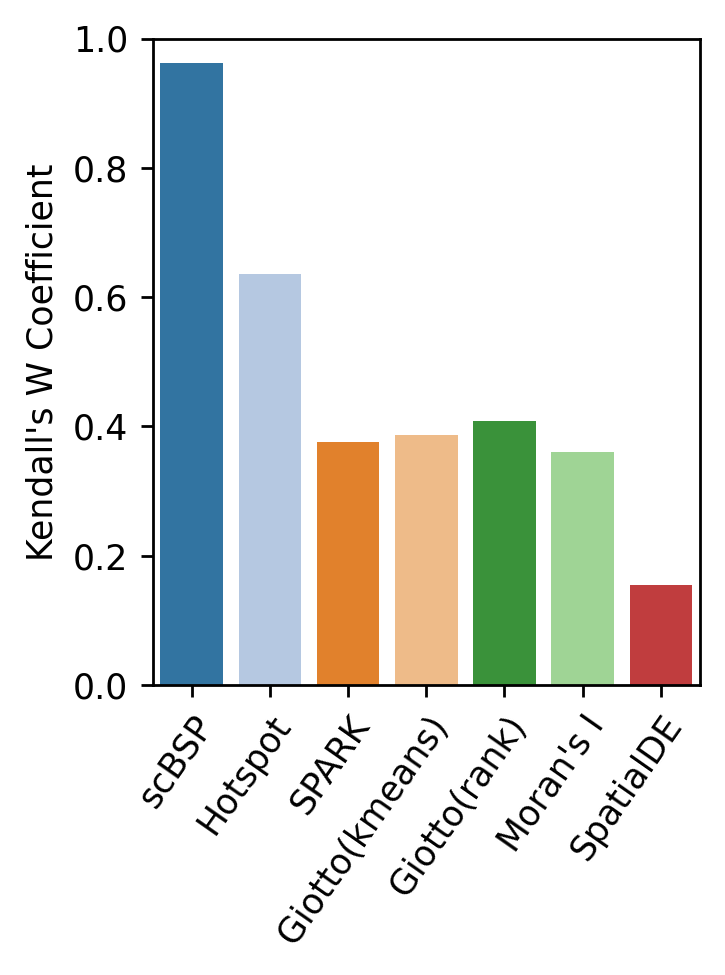

In [60]:
kw_summary = pd.Series({
    'scBSP': scBSP_kw[0],
    'Hotspot': hotspot_kw[0],
    'Giotto(kmeans)': giotto_kmeans_kw[0],
    'Giotto(rank)': giotto_rank_kw[0],
    'Moran\'s I': MI_kw[0],
    'SpatialDE': spatialde_kw[0],
    'SPARK': spark_kw[0]
}, name='Kendall\'s W')

plt.figure(figsize=(3, 4), dpi=250)
# kw_sorted = kw_summary.sort_values(ascending=False)
kw_sorted = kw_summary[r_sorted.index]
sns.barplot(x=kw_sorted.index, y=kw_sorted.values, palette='tab20')
plt.ylabel('Kendall\'s W Coefficient')
# plt.title('Pearson r for Each Method')
plt.xticks(rotation=55, ha='right', rotation_mode='anchor')
plt.ylim(0, 1)
plt.xlabel(None)
plt.tight_layout()
plt.show()

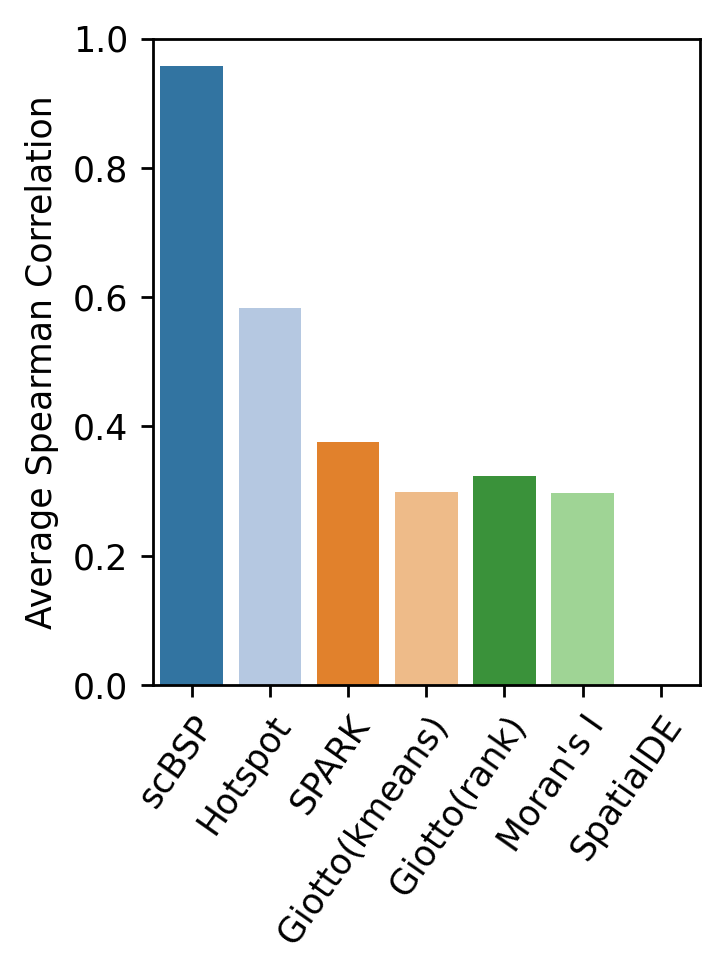

In [61]:
spearman_summary = pd.Series({
    'scBSP': scBSP_spearman,
    'Hotspot': hotspot_spearman,
    'Giotto(kmeans)': giotto_kmeans_spearman,
    'Giotto(rank)': giotto_rank_spearman,
    'Moran\'s I': moransi_spearman,
    'SpatialDE': spatialde_spearman,
    'SPARK': spark_spearman,
}, name='Spearman Correlation')

plt.figure(figsize=(3, 4), dpi=250)
spearman_sorted = spearman_summary[r_sorted.index]
sns.barplot(x=spearman_sorted.index, y=spearman_sorted.values, palette='tab20')
plt.ylabel('Average Spearman Correlation')
# plt.title('Pearson r for Each Method')
plt.xticks(rotation=55, ha='right', rotation_mode='anchor')
plt.ylim(0, 1)
plt.xlabel(None)
plt.tight_layout()
plt.show()

# Fig. 6A: Spatial Proteomics CODEX Example

In [10]:
Marker_list = [
    'DAPI', 'MPO', 'Ecadherin', 'PDL1', 'CD163', 'PD1', 'CD47', 
    'GAL3', 'PARP1', 'LAG3', 'CD4', 'PI3KCA', 'TIM3', 'CD68', 
    'ER', 'PR', 'MSH2', 'CD8', 'MSH6', 'bCatenin1', 'HLAABC', 
    'MLH1', 'Ki67', 'CD20', 'ARID1A', 'IFNG', 'CD31', 'PMS', 
    'CD44', 'PanCytokeratin', 'CD3e']

In [11]:
sim = ss.util.sim_from_json(
    input_file='../fig_data/CODEX/tile_39.json',
    shape=(50, 50),
    num_iteration=4,
    n_iter=6,
)

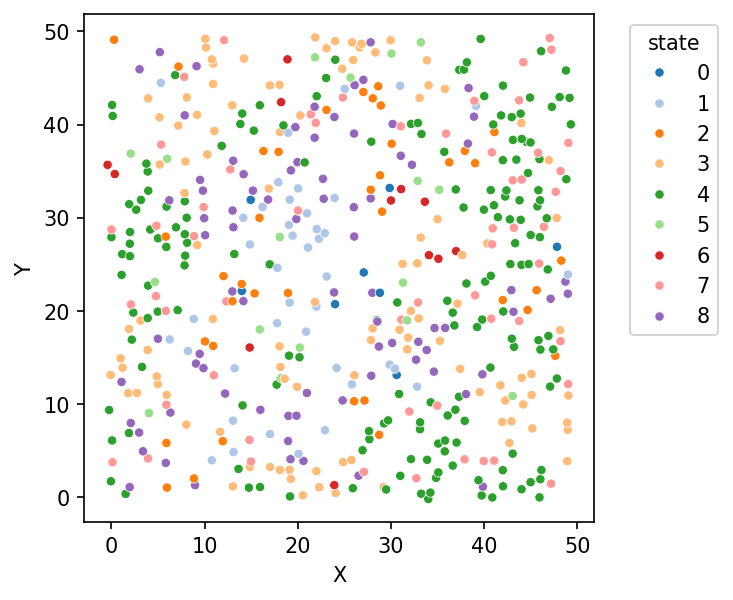

In [12]:
sim.plot(figsize=(5,5))

In [13]:
sim.update_seed(seed=1)
sim.fit_scdesign(
    '../fig_data/CODEX/tile_39_expr_mat.csv',
    '../fig_data/CODEX/tile_39_meta.csv',
    'phenotype',
    'X_centroid',
    'Y_centroid',
    seed=0,
)

Temporary directory created.
scDesgin fit complete.


In [3]:
cells = pd.read_csv("/Users/zhaotianxiao/Library/CloudStorage/Dropbox/FenyoLab/Project/Spatialsim/simspace-reproducibility/main_figures/Fig6/Panel_A_B_C_data/CODEX_ref.csv")
cell_counts = cells['cell_type'].value_counts()
# cells = cells[cells['cell_type'].isin(cell_counts[cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(cells['cell_type'].value_counts().index, 1)}
cells['celltype_rank'] = cells['cell_type'].map(ranked_cell_types)

cells['x_centroid'] = 50 * (cells['centroid_x'] - cells['centroid_x'].min()) / (cells['centroid_x'].max() - cells['centroid_x'].min())
cells['y_centroid'] = 50 * (cells['centroid_y'] - cells['centroid_y'].min()) / (cells['centroid_y'].max() - cells['centroid_y'].min())

cells['cell_type'] = cells['cell_type'].replace('CD4+ T cells', 'Helper T cells')

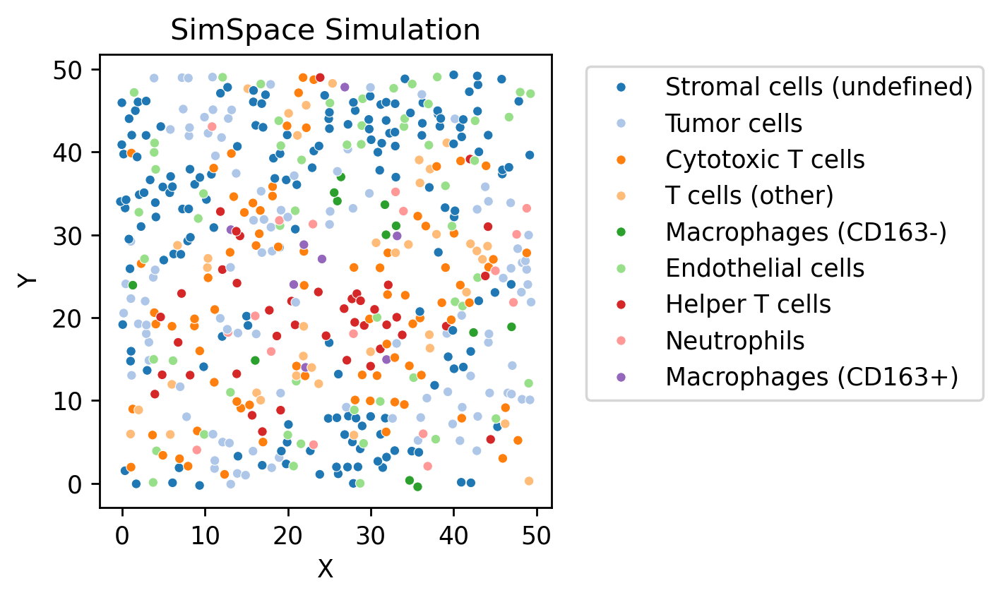

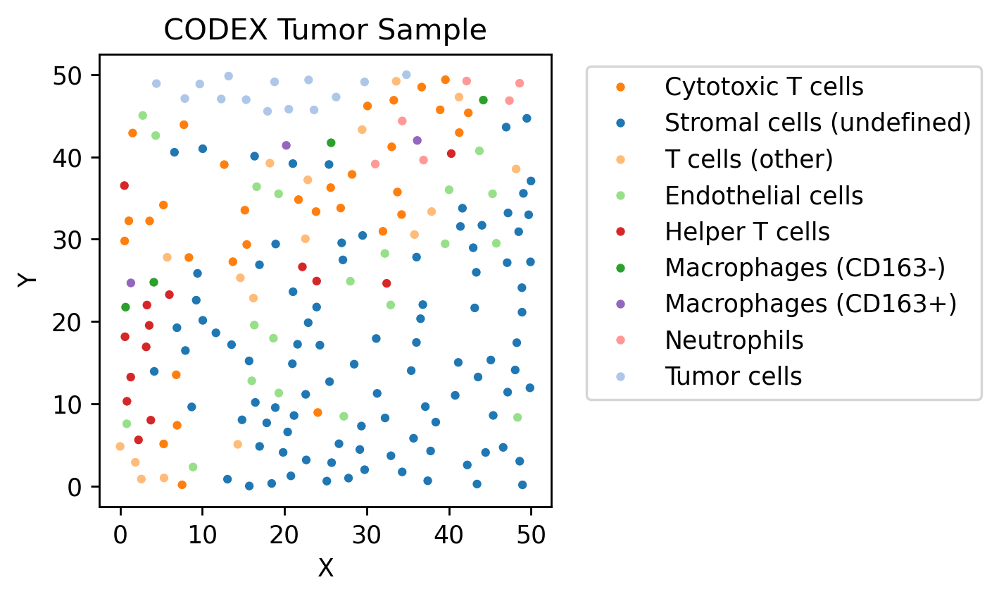

In [15]:
# Get unique cell types from both sim.meta['fitted_celltype'] and cells['phenotype']
sim_celltypes = sim.meta['fitted_celltype'].unique()
# cells_celltypes = cells['phenotype'].unique()
cells_celltypes = cells['cell_type'].unique()
all_celltypes = pd.unique(np.concatenate([sim_celltypes, cells_celltypes]))

# Create a consistent palette mapping
palette = dict(zip(
    all_celltypes,
    sns.color_palette('tab20', n_colors=len(all_celltypes))
))

plt.figure(figsize=(6, 3.5), dpi=250)
sns.scatterplot(
    x='row', y='col', data=sim.meta,
    hue='fitted_celltype', palette=palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 3.5), dpi=250)
sns.scatterplot(
    x='x_centroid', y='y_centroid', data=cells,
    hue='cell_type', palette=palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('CODEX Tumor Sample')
plt.tight_layout()
plt.show()

# Fig. 6B: CODEX cell-cell interaction heatmap

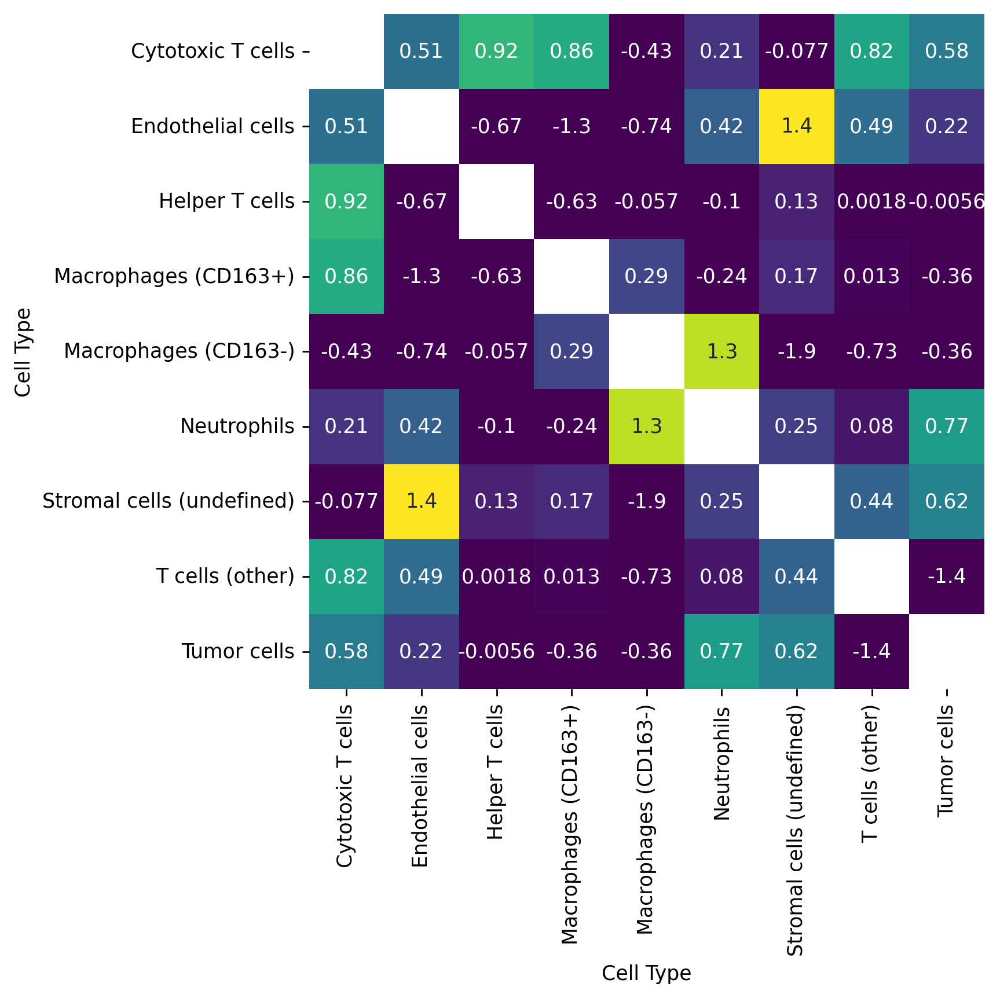

In [17]:
state_to_celltype = dict(zip(sim.meta.state.unique(), sim.meta.fitted_celltype.unique()))

hm_data = sim.theta[0].copy()
hm_data = pd.DataFrame(hm_data, index=range(hm_data.shape[0]), columns=range(hm_data.shape[1]))
hm_data.index = hm_data.index.map(state_to_celltype)
hm_data.columns = hm_data.columns.map(state_to_celltype)

hm_data = hm_data.reindex(sorted(hm_data.columns), axis=1)
hm_data = hm_data.reindex(sorted(hm_data.index), axis=0)

# make all diagonal elements NA for hm_data
hm_data.values[np.diag_indices_from(hm_data)] = np.nan

# plot na as gray
plt.figure(figsize=(7,7), dpi=250)
sns.heatmap(hm_data, annot=True, cmap='viridis', vmin=0, fmt='.2g', 
            mask=np.eye(hm_data.shape[0], dtype=bool), 
            cbar_kws={'label': 'Interaction Strength'}, square=True, 
            linewidths=0, linecolor='black')
plt.xlabel('Cell Type')
plt.ylabel('Cell Type')
plt.gca().collections[0].colorbar.remove()
plt.gca().set_aspect('equal')
plt.xticks(rotation=90)
plt.tight_layout()

In [18]:
cells = pd.read_csv("../fig_data/CODEX/tile_39_ref.csv")
cell_counts = cells['cell_type'].value_counts()
# cells = cells[cells['cell_type'].isin(cell_counts[cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(cells['cell_type'].value_counts().index, 1)}
cells['celltype_rank'] = cells['cell_type'].map(ranked_cell_types)

cells['x_centroid'] = 50 * (cells['centroid_x'] - cells['centroid_x'].min()) / (cells['centroid_x'].max() - cells['centroid_x'].min())
cells['y_centroid'] = 50 * (cells['centroid_y'] - cells['centroid_y'].min()) / (cells['centroid_y'].max() - cells['centroid_y'].min())

cells['cell_type'] = cells['cell_type'].replace('CD4+ T cells', 'Helper T cells')

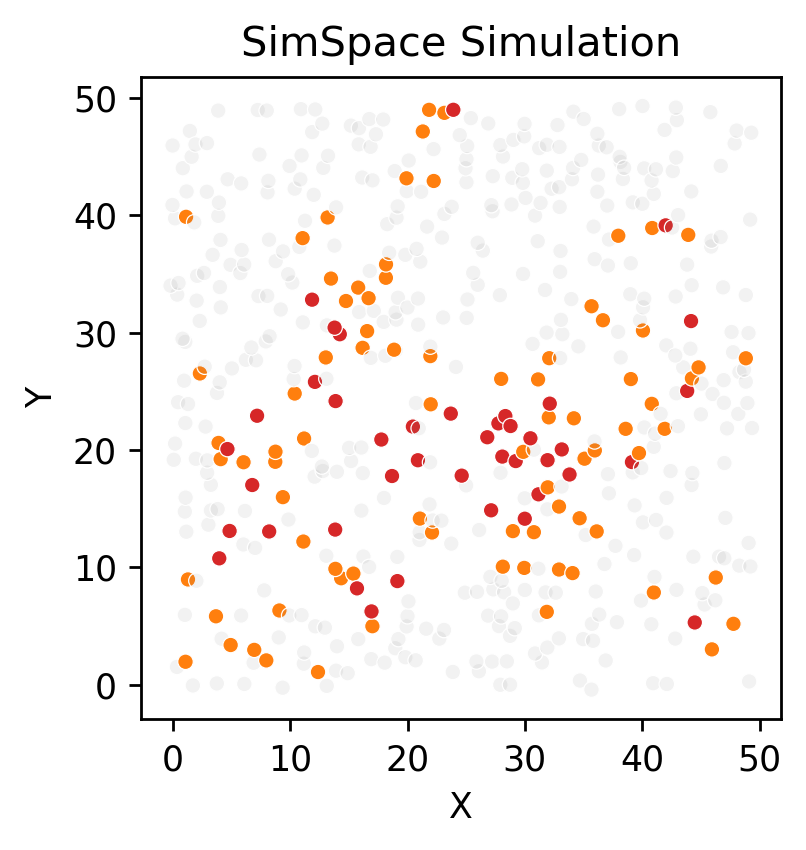

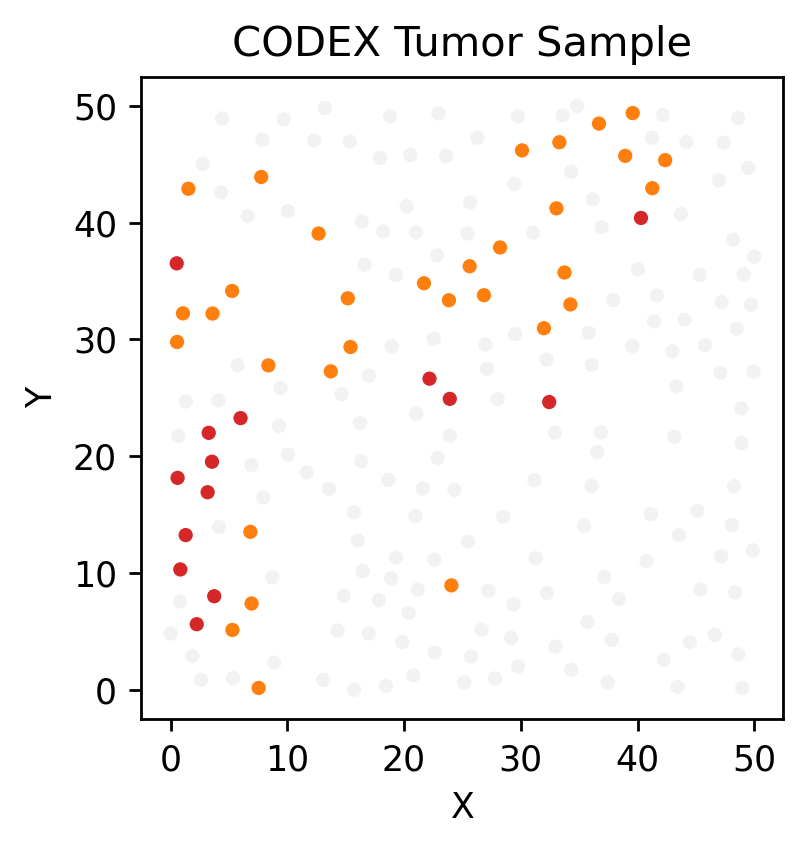

In [ ]:
import colorsys

# Get unique cell types from both sim.meta['fitted_celltype'] and cells['phenotype']
sim_celltypes = sim.meta['fitted_celltype'].unique()
# cells_celltypes = cells['phenotype'].unique()
cells_celltypes = cells['cell_type'].unique()
all_celltypes = pd.unique(np.concatenate([sim_celltypes, cells_celltypes]))

# Create a consistent palette mapping
palette = dict(zip(
    all_celltypes,
    sns.color_palette('tab20', n_colors=len(all_celltypes))
))

# Only show Cytotoxic T cells and Helper T cells in color, others in transparent gray
highlight_types = ['Cytotoxic T cells', 'Helper T cells']
highlight_colors = {k: palette[k] for k in highlight_types}
other_color = (0.5, 0.5, 0.5, 0.1)  # transparent gray

# Build new palette: keep original color for highlights, gray for others
plot_palette = {k: highlight_colors[k] if k in highlight_types else other_color for k in palette}

plt.figure(figsize=(5, 3.5), dpi=250)
sns.scatterplot(
    x='row', y='col', data=sim.meta,
    hue='fitted_celltype', palette=plot_palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 3.5), dpi=250)
sns.scatterplot(
    x='x_centroid', y='y_centroid', data=cells,
    hue='cell_type', palette=plot_palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
plt.legend([], [], frameon=False)
plt.title('CODEX Tumor Sample')
plt.tight_layout()
plt.show()


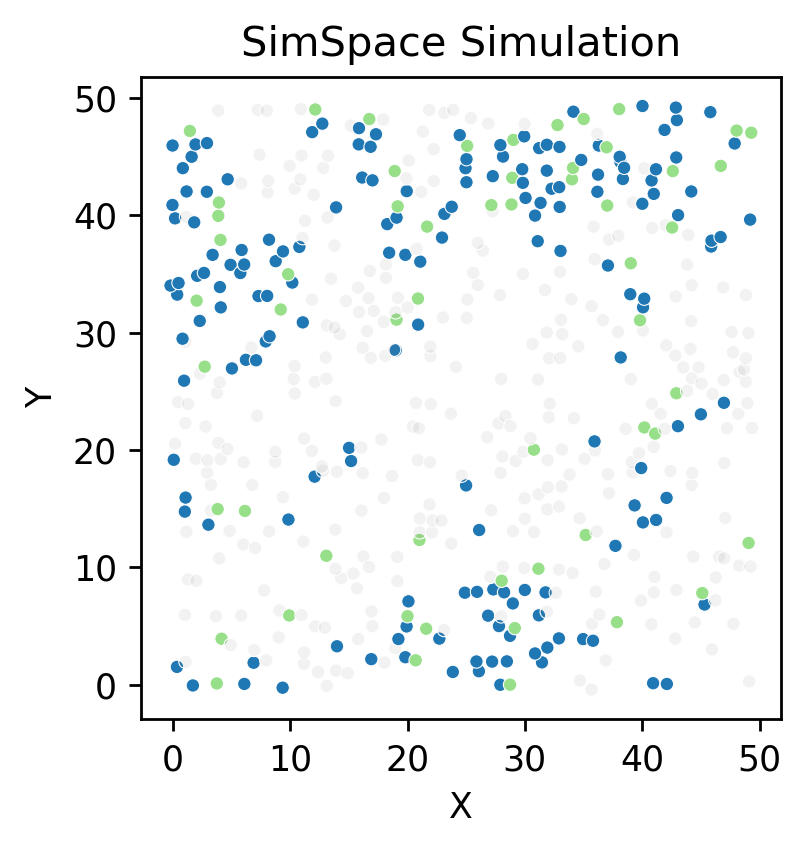

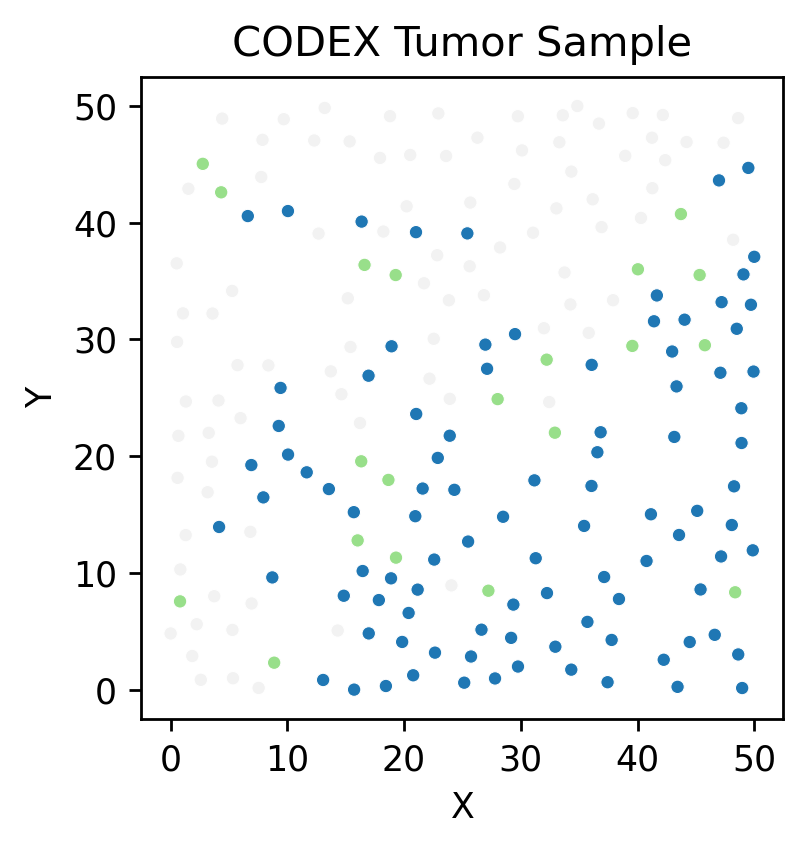

In [44]:
# Only show Endothelial cells and Stromal cells in color, others in transparent gray
highlight_types = ['Endothelial cells', 'Stromal cells (undefined)']
highlight_colors = {k: palette[k] for k in highlight_types}
other_color = (0.5, 0.5, 0.5, 0.1)  # transparent gray

# Build new palette: keep original color for highlights, gray for others
plot_palette = {k: highlight_colors[k] if k in highlight_types else other_color for k in palette}

plt.figure(figsize=(5, 3.5), dpi=250)
sns.scatterplot(
    x='row', y='col', data=sim.meta,
    hue='fitted_celltype', palette=plot_palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([], [], frameon=False)
plt.title('SimSpace Simulation')
plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 3.5), dpi=250)
sns.scatterplot(
    x='x_centroid', y='y_centroid', data=cells,
    hue='cell_type', palette=plot_palette, legend=True, s=15
)
plt.xlabel('X')
plt.ylabel('Y')
plt.gca().set_aspect('equal')
plt.legend([], [], frameon=False)
plt.title('CODEX Tumor Sample')
plt.tight_layout()
plt.show()


## Perturbation test: change the spatial proximity score

In [45]:
cells = pd.read_csv("../fig_data/CODEX/tile_39_ref.csv")
cell_counts = cells['cell_type'].value_counts()
# cells = cells[cells['cell_type'].isin(cell_counts[cell_counts >= 10].index)]
ranked_cell_types = {cell_type: rank for rank, cell_type in enumerate(cells['cell_type'].value_counts().index, 1)}
cells['celltype_rank'] = cells['cell_type'].map(ranked_cell_types)

cells['x_centroid'] = 50 * (cells['centroid_x'] - cells['centroid_x'].min()) / (cells['centroid_x'].max() - cells['centroid_x'].min())
cells['y_centroid'] = 50 * (cells['centroid_y'] - cells['centroid_y'].min()) / (cells['centroid_y'].max() - cells['centroid_y'].min())

cells['cell_type'] = cells['cell_type'].replace('CD4+ T cells', 'Helper T cells')

# Only show Cytotoxic T cells and Helper T cells in color, others in transparent gray
highlight_types = ['Cytotoxic T cells', 'Helper T cells']
highlight_colors = {k: palette[k] for k in highlight_types}
other_color = (0.5, 0.5, 0.5, 0.1)  # transparent gray

# Build new palette: keep original color for highlights, gray for others
plot_palette = {k: highlight_colors[k] if k in highlight_types else other_color for k in palette}

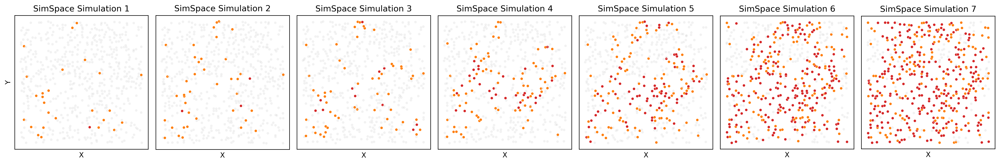

In [46]:
fig, axes = plt.subplots(1, 7, figsize=(20, 4), dpi=250)
axes = axes.flatten()

for i in range(7):
    sim_p = ss.util.sim_from_json(
        input_file=f'../fig_data/CODEX/perturb/tile_39_perturb_{i+1}.json',
        shape=(50, 50),
        num_iteration=4,
        n_iter=6,
    )
    state_to_fitted_celltype = sim.meta[['state', 'fitted_celltype']].drop_duplicates().set_index('state')['fitted_celltype'].to_dict()
    sim_p.meta['fitted_celltype'] = sim_p.meta['state'].map(state_to_fitted_celltype)

    ax = axes[i]
    sns.scatterplot(
        x='row', y='col', data=sim_p.meta,
        hue='fitted_celltype', palette=plot_palette, legend=False, s=15, ax=ax
    )
    ax.set_xlabel('X')
    if i == 0:
        ax.set_ylabel('Y')
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
    ax.set_aspect('equal')
    ax.set_title(f'SimSpace Simulation {i+1}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

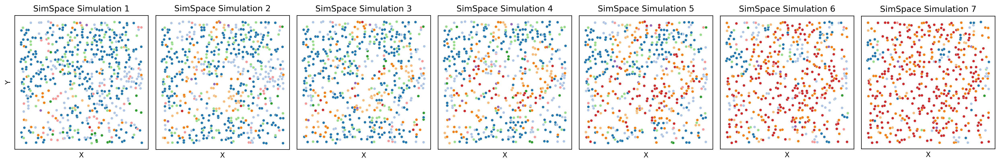

In [47]:
fig, axes = plt.subplots(1, 7, figsize=(20, 4), dpi=250)
axes = axes.flatten()

for i in range(7):
    sim_p = ss.util.sim_from_json(
        input_file=f'../fig_data/CODEX/perturb/tile_39_perturb_{i+1}.json',
        shape=(50, 50),
        num_iteration=4,
        n_iter=6,
    )
    state_to_fitted_celltype = sim.meta[['state', 'fitted_celltype']].drop_duplicates().set_index('state')['fitted_celltype'].to_dict()
    sim_p.meta['fitted_celltype'] = sim_p.meta['state'].map(state_to_fitted_celltype)

    ax = axes[i]
    sns.scatterplot(
        x='row', y='col', data=sim_p.meta,
        hue='fitted_celltype', palette=palette, legend=False, s=15, ax=ax
    )
    ax.set_xlabel('X')
    if i == 0:
        ax.set_ylabel('Y')
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])
    ax.set_aspect('equal')
    ax.set_title(f'SimSpace Simulation {i+1}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()